<a href="https://colab.research.google.com/github/reachusama/product-review-analysis/blob/main/Python_Notebooks_and_Scripting.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import random

def coloring(a):
  clr_lst = ["#F7BFBD","#FF3333","#080F0F" ,"#FCFBE8","#4E504E","#FF8D38","#FFCA33","#FFF933","#05B4F7","#037C74","#066F38" , "#C0FF33" , "#33FF33" , "#0047FF" , "#082160" ,"#49448A", "#B802FE" ,"#B996C6", "#FE02D0" , "#FE026B"]
  clrs = []
  for i in range(a):
    n = random.choice(clr_lst)
    clrs.append(n)
    clr_lst.remove(n)
  return clrs


In [2]:
!pip install pandas
!pip install numpy
!pip install openai
!pip install retry
!pip install -U sentence-transformers
!pip install transformers

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
from sentence_transformers import SentenceTransformer
from transformers import GPT2TokenizerFast
import openai
import pandas as pd
import numpy as np
from retry import retry
from google.colab import drive
from time import sleep
import os

In [4]:
# contants for setting base_path and other configs so each user can adapt them.
user_name = "USAMA"
BASE_PATH = ""

In [5]:
RETRY_COUNT = 5
SLEEP_THRESHOLD = 3

In [14]:
# Mounting Google Drive for Fetching Datasets
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [12]:
BASE_PATH = get_base_path(user_name)

# Dataset Exploration
---
**Author: Usama Shahid**



In [34]:
df = pd.read_json(f"{BASE_PATH}/chunk_1.json")

In [35]:
df.head()

,review_id,review_header,review_text,author_name,review_asin,author_link,author_id,rating,review_posted_date,review_posted_date_f,is_verified,badge,reviews_count,brand,asin,warning
0,R4I8PJ9FR0GF3,FALSE ADVERTISING!!!!!! NOT AS ADVERISED! ALL ...,If I could give this a ZERO RATING I would!! I...,mrslokuntry,B0822KNQKT,/gp/profile/amzn1.account.AGXQQFG2AR4GEFCG66Q4...,AGXQQFG2AR4GEFCG66Q4VXBIW22A,1.0,"November 17, 2020",2020-11-17T00:00:00.000Z,1.0,Verified Purchase,107.0,Chef's Path,B0822KNQKT,NaN
1,R1KHEH6D35PXM,"Weird, acrid chemical smell in the lids.",I was looking forward to using these container...,Ruthulhu,B0822KNQKT,/gp/profile/amzn1.account.AHXI6HJME6CETZ3YD2B4...,AHXI6HJME6CETZ3YD2B4CQMJNT5A,1.0,"September 25, 2020",2020-09-25T00:00:00.000Z,1.0,Verified Purchase,107.0,Chef's Path,B0822KNQKT,NaN
2,R35MGJ0HDCABLM,Buyer Beware- NOTHING like the picture,*BUYER BEWARE * NOTHING. LIKE. THE. PICTURE. I...,Melvin,B0822KNQKT,/gp/profile/amzn1.account.AE5N76YYXL6AZ6PHSAKO...,AE5N76YYXL6AZ6PHSAKO7JEHYATQ,1.0,"January 10, 2021",2021-01-10T00:00:00.000Z,1.0,Verified Purchase,107.0,Chef's Path,B0822KNQKT,NaN
3,RK4HRLNJWC7MT,This is what I get for being busy,I have been busy mom and not able to shop in s...,sara,B0822KNQKT,/gp/profile/amzn1.account.AG75BU26YPWSV2VYH3OC...,AG75BU26YPWSV2VYH3OCSOAXBS7A,1.0,"February 13, 2021",2021-02-13T00:00:00.000Z,1.0,Verified Purchase,107.0,Chef's Path,B0822KNQKT,NaN
4,RWGBX6LYL6KXK,TOO SMALL!!,I’m not quite sure why I thought these contain...,Tiffany Siess,B0822KNQKT,/gp/profile/amzn1.account.AER56RPU2HDRG7D7AKQ5...,AER56RPU2HDRG7D7AKQ5JYATNK5A,1.0,"November 16, 2020",2020-11-16T00:00:00.000Z,1.0,Verified Purchase,107.0,Chef's Path,B0822KNQKT,NaN


In [36]:
df.tail()

,review_id,review_header,review_text,author_name,review_asin,author_link,author_id,rating,review_posted_date,review_posted_date_f,is_verified,badge,reviews_count,brand,asin,warning
99995,R2PVJ8KELJPCAO,7 piece outdoor sectional,Nice set,AK,B09DNYFFVG,/gp/profile/amzn1.account.AF77M5MTAQBQ7KYXTF5Q...,AF77M5MTAQBQ7KYXTF5QNJ63CLOQ,5.0,"October 24, 2020",2020-10-24T00:00:00.000Z,1.0,Verified Purchase,11.0,Gotland,B09DNYFFVG,NaN
99996,R1AEYH2QOLCQHH,Awesome furniture,Great patio furniture set. Great communication...,Amazon Customer,B09DNYFFVG,/gp/profile/amzn1.account.AHHEW37CDVM5ZUFNNUUA...,AHHEW37CDVM5ZUFNNUUAGCKYODXQ,5.0,"February 23, 2021",2021-02-23T00:00:00.000Z,1.0,Verified Purchase,11.0,Gotland,B09DNYFFVG,NaN
99997,RBVTUGVC8B4LA,Love our outdoor sofa!,I had been looking for an outdoor sofa for qui...,Peggy Jackson,B09DNYFFVG,/gp/profile/amzn1.account.AFGRRGOMXK6Q3LWZA7S2...,AFGRRGOMXK6Q3LWZA7S2QN5JAE7A,5.0,"August 18, 2020",2020-08-18T00:00:00.000Z,0.0,,11.0,Gotland,B09DNYFFVG,NaN
99998,RUURQ2WAM7RH,Very strong rubber odor,"Very strong rubber odor, I have left the knock...",Kurt,B07BDK71TR,/gp/profile/amzn1.account.AGZU2UOA4BCV5DHYRRTC...,AGZU2UOA4BCV5DHYRRTCFIQIDP2A,1.0,"August 28, 2019",2019-08-28T00:00:00.000Z,1.0,Verified Purchase,8.0,Apexstone,B07BDK71TR,NaN
99999,R21IHDS0F74O90,Product won’t last long. Already falling apart,I have not had this very long at all and alrea...,Connie Trinkle,B07BDK71TR,/gp/profile/amzn1.account.AFTD2XCTEHJNUJMVPUWP...,AFTD2XCTEHJNUJMVPUWPNPDQ35GA,1.0,"August 21, 2020",2020-08-21T00:00:00.000Z,1.0,Verified Purchase,8.0,Apexstone,B07BDK71TR,NaN


In [37]:
df.shape

(100000, 16)

In [38]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 16 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   review_id             99100 non-null  object 
 1   review_header         99100 non-null  object 
 2   review_text           99100 non-null  object 
 3   author_name           99100 non-null  object 
 4   review_asin           99100 non-null  object 
 5   author_link           99100 non-null  object 
 6   author_id             99100 non-null  object 
 7   rating                99100 non-null  float64
 8   review_posted_date    99100 non-null  object 
 9   review_posted_date_f  99100 non-null  object 
 10  is_verified           99100 non-null  float64
 11  badge                 99100 non-null  object 
 12  reviews_count         99100 non-null  float64
 13  brand                 99023 non-null  object 
 14  asin                  99100 non-null  object 
 15  warning           

In [39]:
df.describe(include='all')

,review_id,review_header,review_text,author_name,review_asin,author_link,author_id,rating,review_posted_date,review_posted_date_f,is_verified,badge,reviews_count,brand,asin,warning
count,99100,99100,99100,99100,99100,99100,99100,99100.000000,99100,99100,99100.000000,99100,99100.000000,99023,99100,900
unique,84259,65645,83010,61057,3456,78854,78854,NaN,2990,2990,NaN,2,NaN,173,2145,1
top,R1THWVAXH96IAF,Five Stars,Good,Amazon Customer,B07PF8NV7N,,,NaN,"June 29, 2021",2021-06-29T00:00:00.000Z,NaN,Verified Purchase,NaN,Wildone,B0822KNQKT,"page was crawled, but didn't produce any data"
freq,16,452,137,6086,490,4002,4002,NaN,202,202,NaN,96302,NaN,7154,100,900
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,3.365409,NaN,NaN,0.971766,NaN,166.590898,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.491036,NaN,NaN,0.165642,NaN,538.540078,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,0.000000,NaN,1.000000,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.000000,NaN,NaN,1.000000,NaN,16.000000,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4.000000,NaN,NaN,1.000000,NaN,38.000000,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5.000000,NaN,NaN,1.000000,NaN,110.000000,NaN,NaN,NaN


In [42]:
df = df[["review_id", "review_header", "review_text", "rating", "review_posted_date", "is_verified", "reviews_count", "brand"]]

In [50]:
df.head()

,review_id,review_header,review_text,rating,review_posted_date,is_verified,reviews_count,brand
0,R4I8PJ9FR0GF3,FALSE ADVERTISING!!!!!! NOT AS ADVERISED! ALL ...,If I could give this a ZERO RATING I would!! I...,1.0,"November 17, 2020",1.0,107.0,Chef's Path
1,R1KHEH6D35PXM,"Weird, acrid chemical smell in the lids.",I was looking forward to using these container...,1.0,"September 25, 2020",1.0,107.0,Chef's Path
2,R35MGJ0HDCABLM,Buyer Beware- NOTHING like the picture,*BUYER BEWARE * NOTHING. LIKE. THE. PICTURE. I...,1.0,"January 10, 2021",1.0,107.0,Chef's Path
3,RK4HRLNJWC7MT,This is what I get for being busy,I have been busy mom and not able to shop in s...,1.0,"February 13, 2021",1.0,107.0,Chef's Path
4,RWGBX6LYL6KXK,TOO SMALL!!,I’m not quite sure why I thought these contain...,1.0,"November 16, 2020",1.0,107.0,Chef's Path


In [51]:
df["brand"].unique()

array(["Chef's Path", 'fullstar', 'Fullstar', 'OXO', 'Utopia Home',
       'Vtopmart', 'Wildone', 'NATURELO', 'Ultrean', 'Amazon Renewed',
       'Englander', 'Ensenior', 'ComfiLife', 'Live Conscious',
       'Ebanel Laboratories', 'Wisteria Lane', 'tobeDRI',
       'Totally Kitchen', 'Hidrate Spark', 'Coffee Gator', 'TookMag',
       'PhysioNatural', 'House Ur Home', 'ORDORA', 'Ola Prima',
       'TheraGun', 'InteVision', 'oaskys', 'SpriteGru', "Rockin' Green",
       'Everlasting Comfort', 'Incredible Bulk', 'Utopia Kitchen',
       'PECULA', 'BUG BITE THING', 'Homey Pet', "will's", 'EdenProducts',
       'DAYBETTER', '', 'Nieifi', 'Biling', 'Scriveiner',
       'Circadian Optics', 'Cotton Paradise', 'ONNAIS', 'Monument Grills',
       'CrystalTowels', 'Weigh Gram', 'SMARTRO', '500Labels', '1 Body',
       'COVAX', 'Pupford', 'ODesign', 'Sifely', 'MERRYBOX', 'KAC',
       'Annova', 'GOOD LIFE USA', 'Good Life USA', 'POWEROWL',
       'Home Intuition', 'SODUKU', 'Homestead Choice', 'B

In [52]:
df['brand'].value_counts()

Wildone               2865
Utopia Kitchen        2347
OXO                   2250
SIGNORA WARE          2194
Vtopmart              2013
                      ... 
Fullstar                38
BLACKSMITH FAMILY       30
Vriksasana Posture      10
elv                      8
Gaggle                   3
Name: brand, Length: 173, dtype: int64

In [53]:
df.drop_duplicates(subset=['review_header', 'review_text'], inplace=True)

In [54]:
df.shape

(83926, 8)

In [55]:
df.dropna(subset=['review_header', 'review_text'], inplace=True)

In [56]:
df.shape

(83926, 8)

In [57]:
df['brand'].value_counts()

Wildone               2865
Utopia Kitchen        2347
OXO                   2250
SIGNORA WARE          2194
Vtopmart              2013
                      ... 
Fullstar                38
BLACKSMITH FAMILY       30
Vriksasana Posture      10
elv                      8
Gaggle                   3
Name: brand, Length: 173, dtype: int64

In [59]:
df.to_csv(f"{BASE_PATH}/chunk_1_preprocessed.csv", index=None)

# Common Functions
---
**Author: Usama Shahid**



In [6]:
def get_base_path(user_name: str):
  if user_name == "USAMA":
    return "/content/drive/MyDrive/Product Reviews/Dataset"

  elif user_name == "MAMTHA":
    return ""

  return ""

In [7]:
def read_and_preprocess_dataset(file_path, is_csv=True):
  important_vars = ["review_id", "review_header", "review_text", "rating", "review_posted_date", "is_verified", "reviews_count", "brand"]
  try:
    df = pd.read_csv(file_path) if is_csv else pd.read_json(file_path)
    df.drop_duplicates(subset=["review_header", "review_text"], inplace=True)
    df.dropna(subset=["review_header", "review_text"], inplace=True)
    df = df[important_vars]
    return df
  except Exception as e:
    print(f"Exception(read_and_preprocess_dataset): ", e)
    return None

In [8]:
def get_tokenized_string(text: str):
  tokenizer = GPT2TokenizerFast.from_pretrained("gpt2")
  return tokenizer.encode(text)

# Generating Embeddings
---

**Author: Usama Shahid**



## Sentence Transformers

**References:**
* https://www.sbert.net/examples/applications/computing-embeddings/README.html

In [93]:
df = read_and_preprocess_dataset(f"{BASE_PATH}/chunk_1_preprocessed.csv")

In [94]:
df.head(1)

,review_id,review_header,review_text,rating,review_posted_date,is_verified,reviews_count,brand
0,R4I8PJ9FR0GF3,FALSE ADVERTISING!!!!!! NOT AS ADVERISED! ALL ...,If I could give this a ZERO RATING I would!! I...,1.0,"November 17, 2020",1.0,107.0,Chef's Path


In [95]:
df.shape

(83861, 8)

In [90]:
df['combined'] = "Title: " + df.review_header.str.strip() + "; Content: " + df.review_text.str.strip()

In [65]:
df.head()

,review_id,review_header,review_text,rating,review_posted_date,is_verified,reviews_count,brand,combined
0,R4I8PJ9FR0GF3,FALSE ADVERTISING!!!!!! NOT AS ADVERISED! ALL ...,If I could give this a ZERO RATING I would!! I...,1.0,"November 17, 2020",1.0,107.0,Chef's Path,Title: FALSE ADVERTISING!!!!!! NOT AS ADVERISE...
1,R1KHEH6D35PXM,"Weird, acrid chemical smell in the lids.",I was looking forward to using these container...,1.0,"September 25, 2020",1.0,107.0,Chef's Path,"Title: Weird, acrid chemical smell in the lids..."
2,R35MGJ0HDCABLM,Buyer Beware- NOTHING like the picture,*BUYER BEWARE * NOTHING. LIKE. THE. PICTURE. I...,1.0,"January 10, 2021",1.0,107.0,Chef's Path,Title: Buyer Beware- NOTHING like the picture;...
3,RK4HRLNJWC7MT,This is what I get for being busy,I have been busy mom and not able to shop in s...,1.0,"February 13, 2021",1.0,107.0,Chef's Path,Title: This is what I get for being busy; Cont...
4,RWGBX6LYL6KXK,TOO SMALL!!,I’m not quite sure why I thought these contain...,1.0,"November 16, 2020",1.0,107.0,Chef's Path,Title: TOO SMALL!!; Content: I’m not quite sur...


In [66]:
STE_model = SentenceTransformer('all-MiniLM-L6-v2')

Downloading:   0%|          | 0.00/1.18k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/190 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/10.6k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/612 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/116 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/39.3k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/90.9M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/53.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/112 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/466k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/350 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/13.2k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/232k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/349 [00:00<?, ?B/s]

In [68]:
STE_embeddings = STE_model.encode(df.combined.values, convert_to_tensor=False)

In [72]:
for sentence, embedding in zip(df.combined.values, STE_embeddings):
    print("Sentence:", sentence)
    print("Embedding:", embedding)
    print("")
    break

Sentence: Title: FALSE ADVERTISING!!!!!! NOT AS ADVERISED! ALL SMALL CONTAINERS!!!; Content: If I could give this a ZERO RATING I would!! I bought these because they had more good reviews than bad. I should have listened to the BAD reviewers! I finally got around to cleaning my pantry and was excited to use these. Unfortunately, These are ALL SMALL containers! SEE PHOTO OF PASTA IN CONTATINER! How am I supposed to get the lid on without breaking up the pasta? NOW I'M OUT $45 BECAUSE THEY CAN'T BE RETURNED!!!!! They are hard to close and some won't close all the way and they smell!! I guess that's why they have a no return policy. I will do as my husband told me next time I order from Amazon," Make sure that you can return it before you purchase." DON'T BUY THESE, YOU CAN GET SOME FROM THE DOLLAR STORE FOR LESS!!!!!
Embedding: [-5.3986e-03,  6.6709e-03,  1.4786e-02,  6.8348e-02,  8.8113e-02,
        -5.2730e-02,  5.7512e-02, -6.2546e-02,  2.4495e-02, -7.8612e-02,
         6.1970e-02,  1

In [ ]:
df["STE_embeddings"] = ""

In [ ]:
for index, embedding in enumerate(df.STE_embeddings.values):
    df["STE_embeddings"].iloc[index] = embedding
    print(index, len(embedding))

In [71]:
df.head()

,review_id,review_header,review_text,rating,review_posted_date,is_verified,reviews_count,brand,combined,STE_embeddings
0,R4I8PJ9FR0GF3,FALSE ADVERTISING!!!!!! NOT AS ADVERISED! ALL ...,If I could give this a ZERO RATING I would!! I...,1.0,"November 17, 2020",1.0,107.0,Chef's Path,Title: FALSE ADVERTISING!!!!!! NOT AS ADVERISE...,"[-5.3986e-03, 6.6709e-03, 1.4786e-02, 6.834..."
1,R1KHEH6D35PXM,"Weird, acrid chemical smell in the lids.",I was looking forward to using these container...,1.0,"September 25, 2020",1.0,107.0,Chef's Path,"Title: Weird, acrid chemical smell in the lids...","[ 6.6079e-02, -4.7454e-02, 5.3329e-02, 3.106..."
2,R35MGJ0HDCABLM,Buyer Beware- NOTHING like the picture,*BUYER BEWARE * NOTHING. LIKE. THE. PICTURE. I...,1.0,"January 10, 2021",1.0,107.0,Chef's Path,Title: Buyer Beware- NOTHING like the picture;...,"[-5.3846e-02, 1.0647e-01, 8.3936e-04, 2.314..."
3,RK4HRLNJWC7MT,This is what I get for being busy,I have been busy mom and not able to shop in s...,1.0,"February 13, 2021",1.0,107.0,Chef's Path,Title: This is what I get for being busy; Cont...,"[-5.8914e-02, 9.8236e-03, 3.6367e-02, 5.050..."
4,RWGBX6LYL6KXK,TOO SMALL!!,I’m not quite sure why I thought these contain...,1.0,"November 16, 2020",1.0,107.0,Chef's Path,Title: TOO SMALL!!; Content: I’m not quite sur...,"[ 3.4800e-02, 3.8797e-02, 1.0047e-02, -5.306..."


In [ ]:
df.to_csv(f"{BASE_PATH}/chunk_1_STE_embeddings.csv", index=None)

## OpenAI Embeddings - Babbage

**References:**

* https://beta.openai.com/docs/guides/embeddings/what-are-embeddings

In [13]:
df = read_and_preprocess_dataset(f"{BASE_PATH}/chunk_2.json", is_csv=False)

In [14]:
df.head()

,review_id,review_header,review_text,rating,review_posted_date,is_verified,reviews_count,brand
0,R176WUN6YB5Y2J,"Stinky, sloppy cut hose.","It was cheap, but I guess you get what you it ...",1.0,"March 19, 2021",1.0,8.0,Apexstone
1,RWSJHY80TLLZW,SMELLS awful,has that horrible harbor freight VOC smell.. f...,1.0,"May 16, 2020",1.0,8.0,Apexstone
2,R2NPVTFY0ZRCK9,Terrible Rubber Smell,Thought the smell issue got resolved per some ...,1.0,"August 25, 2021",1.0,8.0,Apexstone
3,RURFK88JSDXAD,"Knock Knock, broken",After 1 month it falls apart,1.0,"May 6, 2020",1.0,8.0,Apexstone
4,R28R3CJZSSCRM7,Smelled like burning rubber,Looks great but stunk up my entire house even ...,1.0,"November 8, 2021",1.0,8.0,Apexstone


In [15]:
df.shape

(97687, 8)

In [16]:
df = df.loc[:25000]

In [17]:
df.shape

(24360, 8)

In [18]:
df['combined'] = "Title: " + df.review_header.str.strip() + "; Content: " + df.review_text.str.strip()

In [20]:
df["n_tokens"] = df.combined.apply(lambda x: get_tokenized_string(x))

In [ ]:
df = df[df.n_tokens<2000]

In [29]:
openai.api_key = os.getenv("OPENAI_API_KEY")

In [32]:
def get_openai_embeddings(model: str = "text-similarity-babbage-001", input: str = ""):
  for i in range(RETRY_COUNT):
    try:
      embeddings = openai.Embedding.create(
        model=model,
        input=input
      )
      return embeddings["data"][0]["embedding"]
    except Exception as e:
      print(f"Error(get_openai_embeddings): ", e)
      sleep(SLEEP_THRESHOLD)

In [33]:
get_openai_embeddings(input="HELLO !")

[0.012614703737199306,
 -0.016512639820575714,
 0.013773763552308083,
 -0.014385049231350422,
 0.0084944823756814,
 -0.0020958350505679846,
 -0.006247811019420624,
 0.003612139727920294,
 0.006581239402294159,
 -0.05068109929561615,
 0.0020462176762521267,
 0.043726738542318344,
 0.029675116762518883,
 0.013757886365056038,
 0.01527419127523899,
 0.000374858733266592,
 0.01978341117501259,
 -0.02776981331408024,
 -0.00044357869774103165,
 0.03480356186628342,
 0.12524200975894928,
 0.001280126511119306,
 -0.017751086503267288,
 -0.026039160788059235,
 -0.007637095637619495,
 -0.01299576461315155,
 -0.03648658096790314,
 0.022387327626347542,
 -0.019989820197224617,
 -0.02157757431268692,
 0.027436384931206703,
 0.016941333189606667,
 0.02567397803068161,
 -0.008923175744712353,
 -0.015051905997097492,
 -0.006299412809312344,
 0.02721409872174263,
 -0.042329516261816025,
 0.0019688147585839033,
 -0.023371735587716103,
 -0.008589747361838818,
 0.0064343721605837345,
 0.03597849979996681,

In [ ]:
df["babbage_similarity"] = df.combined.apply(lambda x: get_openai_embeddings(x))

In [116]:
df.head()

,review_id,review_header,review_text,rating,review_posted_date,is_verified,reviews_count,brand,combined,n_tokens,babbage_similarity
0,R176WUN6YB5Y2J,"Stinky, sloppy cut hose.","It was cheap, but I guess you get what you it ...",1.0,"March 19, 2021",1.0,8.0,Apexstone,"Title: Stinky, sloppy cut hose.; Content: It w...",78.0,"[0.00666764285415411, 0.022180898115038872, -0..."
1,RWSJHY80TLLZW,SMELLS awful,has that horrible harbor freight VOC smell.. f...,1.0,"May 16, 2020",1.0,8.0,Apexstone,Title: SMELLS awful; Content: has that horribl...,34.0,"[0.002960040932521224, 0.011734704487025738, -..."
2,R2NPVTFY0ZRCK9,Terrible Rubber Smell,Thought the smell issue got resolved per some ...,1.0,"August 25, 2021",1.0,8.0,Apexstone,Title: Terrible Rubber Smell; Content: Thought...,53.0,"[0.02114497497677803, 0.016543280333280563, -0..."
3,RURFK88JSDXAD,"Knock Knock, broken",After 1 month it falls apart,1.0,"May 6, 2020",1.0,8.0,Apexstone,"Title: Knock Knock, broken; Content: After 1 m...",15.0,"[0.006736414507031441, 0.015398834832012653, -..."
4,R28R3CJZSSCRM7,Smelled like burning rubber,Looks great but stunk up my entire house even ...,1.0,"November 8, 2021",1.0,8.0,Apexstone,Title: Smelled like burning rubber; Content: L...,29.0,"[0.012572546489536762, 0.021474963054060936, 0..."


In [115]:
df.shape

(25001, 11)

In [56]:
df.to_csv(f"{BASE_PATH}/chunk_2_Openai_babbage_embeddings.csv", index=None)

# KMeans Analysis 
---

**Author: Mamtha Bele**

##### #Data analysis using K-Means clustering algorithm
1.KMeans is used to group the samples based on their feature similarities, which can be achieved using the k-means algorithm.

- Peform Clustering Using Different Brands

    - For each brand performed clustering using different cluster size and grouping reviews.

    - For each cluster size, converted each review using sentence-transformer embeddings to vectors. usings numerical vectors visualised the results to group similar reviews as a cluster. 

##### #Reading sentence-transform embeddings and storing in variable (df)

In [ ]:
df = pd.read_csv("/content/drive/MyDrive/chunk_1_STE_embeddings.csv")

###### #Using sklearn-cluster from scikit-learn and importing KMeans

In [ ]:
from sklearn.cluster import KMeans 

##### #Total count by unique brand in descending order. 

In [ ]:
df["brand"].value_counts()

Wildone               2865
Utopia Kitchen        2347
OXO                   2250
SIGNORA WARE          2194
Vtopmart              2013
                      ... 
Fullstar                38
BLACKSMITH FAMILY       30
Vriksasana Posture      10
elv                      8
Gaggle                   3
Name: brand, Length: 172, dtype: int64

##### # From the above result by picking up top most 3 brands and performing k-means clustering.

## Wildone Brand


##### # Filtering data by wildone brand.

In [ ]:
wildone_df = df.loc[df["brand"] == "Wildone"]


In [ ]:
wildone_df.head()

,review_id,review_header,review_text,rating,review_posted_date,is_verified,reviews_count,brand,combined,STE_embeddings
9347,R7IAH0U91M82G,"BUYER BEWARE, Lousy warrantee",I ordered a set and a pal bought another on my...,1.0,"September 30, 2019",1.0,59.0,Wildone,"Title: BUYER BEWARE, Lousy warrantee; Content:...","[-5.2620e-02, -2.4985e-02, 1.0533e-01, -3.249..."
9348,R1IMW99IFV74YQ,Utter Rubbish! Gets scratched from anything,It is utter rubbish! Yes lightweight and has a...,1.0,"June 4, 2020",1.0,59.0,Wildone,Title: Utter Rubbish! Gets scratched from anyt...,"[-4.7086e-02, 4.1450e-02, 8.7419e-02, 4.353..."
9349,R1T9K23E13NNHF,"finish flaked soon after purchase, but not soo...",the finish began flaking off one of the bowls ...,1.0,"December 9, 2019",1.0,59.0,Wildone,"Title: finish flaked soon after purchase, but ...","[ 8.8331e-02, 1.4960e-02, 9.0827e-02, 7.081..."
9350,R150V76LC7LBN7,Lids cant's close plus it get rusted very easily,Lids cant close I had it replaced and still ca...,1.0,"September 15, 2019",1.0,59.0,Wildone,Title: Lids cant's close plus it get rusted ve...,"[-1.4496e-03, 8.6218e-04, -3.6945e-02, 3.786..."
9351,R26Y60YDQYY7K9,"Loved, but starting to rust in less than 2 month",Loved these bowls but unfortunately they are s...,1.0,"July 11, 2020",1.0,59.0,Wildone,"Title: Loved, but starting to rust in less tha...","[-1.7415e-02, -7.3189e-03, 7.7372e-02, 7.164..."


##### #Performing sentence-transform embeddings model for wildone brand. 

In [ ]:
wildone_df["STE_embeddings"] = wildone_df.STE_embeddings.apply(eval).apply(np.array)

<ipython-input-29-0edb5aabc77e>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wildone_df["STE_embeddings"] = wildone_df.STE_embeddings.apply(eval).apply(np.array)


##### # Performing k-means clustering using different cluster sizes on wildone brand.

##### ## Perform kmean clustering using cluster size 6 for wildone brand.

### Cluster Size = 6

https://github.com/openai/openai-cookbook/blob/main/examples/Clustering.ipynb

In [ ]:
num_clusters = 6
clustering_model = KMeans(n_clusters=num_clusters)
clustering_model.fit(wildone_df["STE_embeddings"].to_list())
cluster_assignment = clustering_model.labels_

In [ ]:
print(clustering_model.labels_)

[5 3 5 ... 1 4 1]


In [ ]:
clustered_sentences = [[] for i in range(num_clusters)]
for sentence_id, cluster_id in enumerate(cluster_assignment):
    clustered_sentences[cluster_id].append(wildone_df.combined.values[sentence_id])

In [ ]:
for i, cluster in enumerate(clustered_sentences):
    print("Cluster ", i+1)
    print(cluster)
    print("")

Cluster  1
["Title: GUMBY CUPS- DONT BUY!; Content: These measuring cups look cute don't they? Well there not so cut when you get them home and try to use them. They're cheap! Thin aluminum cups that bends with any kind of heavy substance like flour, sugar, corn meal, oats, milk...you get the picture. So basically anything you would normally need to utilize a measuring cup for, you would not be able to use this product unless your like me and continue to re-bend the handles back in place until I can find a good company who makes better quality products!", 'Title: very difficult to slide along ring; Content: It is so difficult to slide these along the rings that I had to remove the rubber on the handles which then left a really large elongated hole so easy sliding. Once removed, you have on the measuring spoons thin cheap metal that easily bends. The cups are heavier metal. In other words, without the rubber on the handles they are about $5.00 worth of metal. Rip off.', 'Title: Handle b

In [ ]:
wildone_df["Cluster"] = cluster_assignment
wildone_df.groupby("Cluster").rating.mean().sort_values()

<ipython-input-34-6d22cbe10f2c>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wildone_df["Cluster"] = cluster_assignment


Cluster
2    3.103226
3    3.307143
5    3.394628
0    3.505988
1    3.507599
4    3.813187
Name: rating, dtype: float64

###### #It looks like all clusters focused on average reviews, while cluster 5  focused on nearly positive reviews.

In [ ]:
matrix = np.vstack(wildone_df.STE_embeddings.values)
matrix.shape

(2865, 384)

In [ ]:
from sklearn.manifold import TSNE
import matplotlib
import matplotlib.pyplot as plt

In [ ]:
tsne = TSNE(
    n_components=2, perplexity=15, random_state=42, init="random", learning_rate=200
)
vis_dims2 = tsne.fit_transform(matrix)

In [ ]:
x = [x for x, y in vis_dims2]
y = [y for x, y in vis_dims2]

<ipython-input-57-4c95da53b7dc>:6: RuntimeWarning: Mean of empty slice.
  avg_x = xs.mean()
<ipython-input-57-4c95da53b7dc>:7: RuntimeWarning: Mean of empty slice.
  avg_y = ys.mean()


Text(0.5, 1.0, 'Clusters identified visualized in language 2d using t-SNE')

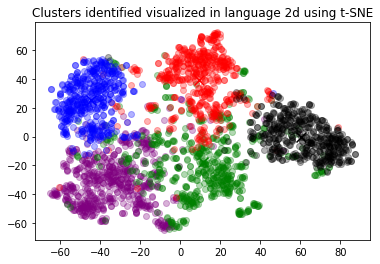

In [ ]:
for category, color in enumerate(["purple", "green", "red", "blue", "black", "yellow"]):
    xs = np.array(x)[wildone_df.Cluster == category]
    ys = np.array(y)[wildone_df.Cluster == category]
    plt.scatter(xs, ys, color=color, alpha=0.3)

    avg_x = xs.mean()
    avg_y = ys.mean()

    plt.scatter(avg_x, avg_y, marker="x", color=color, s=100)
plt.title("Clusters identified visualized in language 2d using t-SNE")

###### #Visualization of clusters in a 2d projection. The blue and purple clusters clearly represents negative reviews. The brown cluster seems quite different from the others.While red and yellow clusters represents positive reviews.

#### Cluster Size = 5

##### #Performed kmean clustering using cluster size 5 

In [ ]:
num_clusters = 5
clustering_model = KMeans(n_clusters=num_clusters)
clustering_model.fit(wildone_df["STE_embeddings"].to_list())
cluster_assignment = clustering_model.labels_

In [ ]:
print(clustering_model.labels_)

[3 1 3 ... 0 2 0]


In [ ]:
clustered_sentences = [[] for i in range(num_clusters)]
for sentence_id, cluster_id in enumerate(cluster_assignment):
    clustered_sentences[cluster_id].append(wildone_df.combined.values[sentence_id])

In [ ]:
for i, cluster in enumerate(clustered_sentences):
    print("Cluster ", i+1)
    print(cluster)
    print("")

Cluster  1
['Title: Smelly plastic !!; Content: I need to check more carefully when I buy stuff. These china containers have a horrible smell even after washing !! Waste of money !', "Title: Persistent chemical smell; Content: I've tried everything I can think of and cannot rid these canisters of an unpleasant chemical odor. Because of this smell, I don't use them to store food or anything that can absorb the odor.", 'Title: Misinformation with potential health implications; Content: The description states that it is "Wildone BPA Free"; however, it is not. BPA free should be clearly labeled on the plastic container. Such label is not on the plastic nor the box.', 'Title: Great Size for storing Bulk Items; Content: The containers are big enough and looked perfect on the first look. However when I looked closely 2 of the 4 containers have walls that are curved inwards, while the other 2 containers have straight walls. It is disappointing that the containers arrived with a deformed shape 

In [ ]:
wildone_df["Cluster"] = cluster_assignment
wildone_df.groupby("Cluster").rating.mean().sort_values()

<ipython-input-44-6d22cbe10f2c>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wildone_df["Cluster"] = cluster_assignment


Cluster
4    3.127701
1    3.367852
3    3.400000
0    3.506747
2    3.680812
Name: rating, dtype: float64

In [ ]:
matrix = np.vstack(wildone_df.STE_embeddings.values)
matrix.shape

(2865, 384)

In [ ]:
from sklearn.manifold import TSNE
import matplotlib
import matplotlib.pyplot as plt

In [ ]:
tsne = TSNE(
    n_components=2, perplexity=15, random_state=42, init="random", learning_rate=200
)
vis_dims2 = tsne.fit_transform(matrix)

In [ ]:
x = [x for x, y in vis_dims2]
y = [y for x, y in vis_dims2]

Text(0.5, 1.0, 'Clusters identified visualized in language 2d using t-SNE')

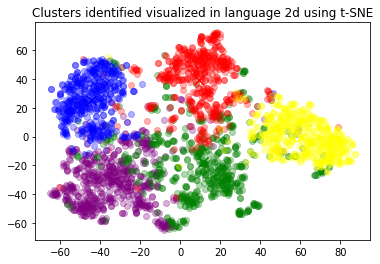

In [ ]:
for category, color in enumerate(["purple", "green", "red", "blue", "yellow"]):
    xs = np.array(x)[wildone_df.Cluster == category]
    ys = np.array(y)[wildone_df.Cluster == category]
    plt.scatter(xs, ys, color=color, alpha=0.3)

    avg_x = xs.mean()
    avg_y = ys.mean()

    plt.scatter(avg_x, avg_y, marker="x", color=color, s=100)
plt.title("Clusters identified visualized in language 2d using t-SNE")

##### ##Visualization of clusters in a 2d projection. The blue and purple clusters clearly represents negative reviews. The green cluster seems average reviews from the others.While red and yellow clusters represents positive reviews.

### Cluster Size = 4

##### #Performed kmean clustering using cluster size 4 

In [ ]:
num_clusters = 4
clustering_model = KMeans(n_clusters=num_clusters)
clustering_model.fit(wildone_df["STE_embeddings"].to_list())
cluster_assignment = clustering_model.labels_

In [ ]:
clustered_sentences = [[] for i in range(num_clusters)]
for sentence_id, cluster_id in enumerate(cluster_assignment):
    clustered_sentences[cluster_id].append(wildone_df.combined.values[sentence_id])

In [ ]:
for i, cluster in enumerate(clustered_sentences):
    print("Cluster ", i+1)
    print(cluster)
    print("")

In [ ]:
wildone_df["Cluster"] = cluster_assignment
wildone_df.groupby("Cluster").rating.mean().sort_values()

In [ ]:
matrix = np.vstack(wildone_df.STE_embeddings.values)
matrix.shape

In [ ]:
from sklearn.manifold import TSNE
import matplotlib
import matplotlib.pyplot as plt

In [ ]:
tsne = TSNE(
    n_components=2, perplexity=15, random_state=42, init="random", learning_rate=200
)
vis_dims2 = tsne.fit_transform(matrix)

In [ ]:
x = [x for x, y in vis_dims2]
y = [y for x, y in vis_dims2]


In [ ]:
for category, color in enumerate(["purple", "green", "red", "blue"]):
    xs = np.array(x)[wildone_df.Cluster == category]
    ys = np.array(y)[wildone_df.Cluster == category]
    plt.scatter(xs, ys, color=color, alpha=0.3)

    avg_x = xs.mean()
    avg_y = ys.mean()

    plt.scatter(avg_x, avg_y, marker="x", color=color, s=100)
plt.title("Clusters identified visualized in language 2d using t-SNE")

##### #Visualization of clusters in a 2d projection. The blue cluster represents negative reviews. The green and purple clusters seems average reviews from the others.While red cluster represents positive reviews.


### Cluster Size = 3

In [ ]:
num_clusters = 3
clustering_model = KMeans(n_clusters=num_clusters)
clustering_model.fit(wildone_df["STE_embeddings"].to_list())
cluster_assignment = clustering_model.labels_

In [ ]:
clustered_sentences = [[] for i in range(num_clusters)]
for sentence_id, cluster_id in enumerate(cluster_assignment):
    clustered_sentences[cluster_id].append(wildone_df.combined.values[sentence_id])

In [ ]:
for i, cluster in enumerate(clustered_sentences):
    print("Cluster ", i+1)
    print(cluster)
    print("")

In [ ]:
matrix = np.vstack(wildone_df.STE_embeddings.values)
matrix.shape

In [ ]:
from sklearn.manifold import TSNE
import matplotlib
import matplotlib.pyplot as plt

In [ ]:
tsne = TSNE(
    n_components=2, perplexity=15, random_state=42, init="random", learning_rate=200
)
vis_dims2 = tsne.fit_transform(matrix)

In [ ]:
x = [x for x, y in vis_dims2]
y = [y for x, y in vis_dims2]


In [ ]:
for category, color in enumerate(["purple", "green", "red", "blue"]):
    xs = np.array(x)[wildone_df.Cluster == category]
    ys = np.array(y)[wildone_df.Cluster == category]
    plt.scatter(xs, ys, color=color, alpha=0.3)

    avg_x = xs.mean()
    avg_y = ys.mean()

    plt.scatter(avg_x, avg_y, marker="x", color=color, s=100)
plt.title("Clusters identified visualized in language 2d using t-SNE")

##### #Visualization of clusters in a 2d projection. The purple cluster clearly represents negative reviews. The green cluster seems average reviews from the others.While most of red cluster represents positive reviews.

### Cluster Size = 2

In [ ]:
num_clusters = 2
clustering_model = KMeans(n_clusters=num_clusters)
clustering_model.fit(wildone_df["STE_embeddings"].to_list())
cluster_assignment = clustering_model.labels_

In [ ]:
clustered_sentences = [[] for i in range(num_clusters)]
for sentence_id, cluster_id in enumerate(cluster_assignment):
    clustered_sentences[cluster_id].append(wildone_df.combined.values[sentence_id])

In [ ]:
for i, cluster in enumerate(clustered_sentences):
    print("Cluster ", i+1)
    print(cluster)
    print("")

In [ ]:
wildone_df["Cluster"] = cluster_assignment
wildone_df.groupby("Cluster").rating.mean().sort_values()

In [ ]:
matrix = np.vstack(wildone_df.STE_embeddings.values)
matrix.shape

In [ ]:
from sklearn.manifold import TSNE
import matplotlib
import matplotlib.pyplot as plt

In [ ]:
tsne = TSNE(
    n_components=2, perplexity=15, random_state=42, init="random", learning_rate=200
)
vis_dims2 = tsne.fit_transform(matrix)

In [ ]:
x = [x for x, y in vis_dims2]
y = [y for x, y in vis_dims2]

In [ ]:
for category, color in enumerate(["purple", "green", "red", "blue"]):
    xs = np.array(x)[wildone_df.Cluster == category]
    ys = np.array(y)[wildone_df.Cluster == category]
    plt.scatter(xs, ys, color=color, alpha=0.3)

    avg_x = xs.mean()
    avg_y = ys.mean()

    plt.scatter(avg_x, avg_y, marker="x", color=color, s=100)
plt.title("Clusters identified visualized in language 2d using t-SNE")

##### #Visualization of clusters in a 2d projection. The green and purple clusters clearly represents both negative reviews and positive reviews ,where most of the datapoints representing towards positive reviews.

WILDONE PRODUCT ANALYSIS:
##### #Overall, Cluster size 5 has best representation of reviews for wildone brand and has  accurate cluster analysis than other cluster sizes.

- Most of the customers reviews represents its a great product
- Not good under high heat, mostly not high temperature oven containers
- Few reviews represents size and thin metal issues.
- Needed standard and sealed proof and need exact pictures as advertised.

#### # product upgradation can be done by improving high heat resistant containers, improvising size and quality of products with more sealed proof.






## OXO 

In [ ]:
OXO_df = df.loc[df["brand"] == "OXO"]

In [ ]:
OXO_df.head()

,review_id,review_header,review_text,rating,review_posted_date,is_verified,reviews_count,brand,combined,STE_embeddings
3290,R3FUWGCOOJTNNY,Cracked at first use! In the garbage!,I expected better from OXO! This thing is goin...,1.0,"November 27, 2020",1.0,7.0,OXO,Title: Cracked at first use! In the garbage!; ...,"[-8.0351e-02, 2.1884e-02, 4.6628e-02, 5.372..."
3291,RN0F9GC4NP0,Waste of money!,Doesn't work.,1.0,"November 4, 2019",1.0,7.0,OXO,Title: Waste of money!; Content: Doesn't work.,"[-2.3136e-02, 6.8324e-02, -3.8082e-03, -1.153..."
3292,R13FGMBNAK9K0J,Would not purchase again,No instructions provided on how to use. Should...,1.0,"March 19, 2021",1.0,7.0,OXO,Title: Would not purchase again; Content: No i...,"[-1.0002e-01, 2.0525e-02, 1.0375e-02, -5.875..."
3293,R38KXXT9TR2PEN,Chinese plastic is a non starter,Why can’t you rocket surgeons make it out of g...,1.0,"October 15, 2020",0.0,7.0,OXO,Title: Chinese plastic is a non starter; Conte...,"[-1.2451e-02, 3.2214e-02, 8.5128e-02, -4.256..."
3294,R3VTT2I87XMA81,"Does not separate ,",This product does not do as described. Will go...,1.0,"October 18, 2021",0.0,7.0,OXO,"Title: Does not separate ,; Content: This prod...","[-4.3020e-02, 1.8682e-02, -4.8784e-02, -1.000..."


In [ ]:
OXO_df["STE_embeddings"] = OXO_df.STE_embeddings.apply(eval).apply(np.array)

<ipython-input-103-776dd3a0cf45>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  OXO_df["STE_embeddings"] = OXO_df.STE_embeddings.apply(eval).apply(np.array)


##### #Performing k-means clustering using different cluster sizes on oxo brand.

## Cluster Size = 5

##### #Performed kmean clustering using cluster size 5 for oxo brand.

In [ ]:
num_clusters = 5
clustering_model = KMeans(n_clusters=num_clusters)
clustering_model.fit(OXO_df["STE_embeddings"].to_list())
cluster_assignment = clustering_model.labels_

In [ ]:
clustered_sentences = [[] for i in range(num_clusters)]
for sentence_id, cluster_id in enumerate(cluster_assignment):
    clustered_sentences[cluster_id].append(OXO_df.combined.values[sentence_id])

In [ ]:
for i, cluster in enumerate(clustered_sentences):
    print("Cluster ", i+1)
    print(cluster)
    print("")

Cluster  1
["Title: Waste of money!; Content: Doesn't work.", 'Title: Would not purchase again; Content: No instructions provided on how to use. Should not have to google', 'Title: Does not separate ,; Content: This product does not do as described. Will go back to the old one we was using.', 'Title: It arrived broken.; Content: It arrived broken. The broken picee was taped into inside so I never got to use it.', 'Title: Not great quality; Content: Very cheaply made for the price, find something better quality', 'Title: Top falls off; Content: The black plastic top does not seat securely. If you don’t hold it on with your other hand it comes off', 'Title: Waste of money; Content: This item did not perform as expected, therefore, I returned it.', 'Title: funciona bien, pero el precio me parece un disparate; Content: Me he quedado sorprendido al recibirla, una jarra totalmente de plástico del tamaño de un vaso de sidra, pero plástico sin Bpa eso si. Es el típico producto que funciona bie

In [ ]:
OXO_df["Cluster"] = cluster_assignment
OXO_df.groupby("Cluster").rating.mean().sort_values()

<ipython-input-107-4aed4b810767>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  OXO_df["Cluster"] = cluster_assignment


Cluster
4    3.000000
1    3.025180
0    3.061069
3    3.161750
2    3.496982
Name: rating, dtype: float64

In [ ]:
matrix = np.vstack(OXO_df.STE_embeddings.values)
matrix.shape

(2250, 384)

In [ ]:
from sklearn.manifold import TSNE
import matplotlib
import matplotlib.pyplot as plt

In [ ]:
tsne = TSNE(
    n_components=2, perplexity=15, random_state=42, init="random", learning_rate=200
)
vis_dims2 = tsne.fit_transform(matrix)

In [ ]:
x = [x for x, y in vis_dims2]
y = [y for x, y in vis_dims2]

Text(0.5, 1.0, 'Clusters identified visualized in language 2d using t-SNE')

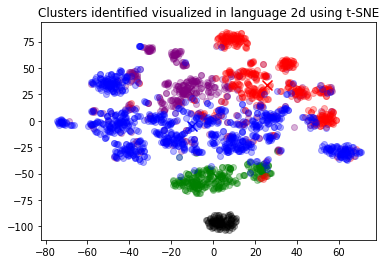

In [ ]:
for category, color in enumerate(["purple", "green", "red", "blue", "black"]):
    xs = np.array(x)[OXO_df.Cluster == category]
    ys = np.array(y)[OXO_df.Cluster == category]
    plt.scatter(xs, ys, color=color, alpha=0.3)

    avg_x = xs.mean()
    avg_y = ys.mean()

    plt.scatter(avg_x, avg_y, marker="x", color=color, s=100)
plt.title("Clusters identified visualized in language 2d using t-SNE")

In [ ]:
from sklearn.manifold import TSNE
import matplotlib
import matplotlib.pyplot as plt

## Cluster Size = 4

###### #Performed kmean clustering using cluster size 4 for oxo brand.

In [ ]:
# Perform kmean clustering
num_clusters = 4
clustering_model = KMeans(n_clusters=num_clusters)
clustering_model.fit(OXO_df["STE_embeddings"].to_list())
cluster_assignment = clustering_model.labels_

In [ ]:
clustered_sentences = [[] for i in range(num_clusters)]
for sentence_id, cluster_id in enumerate(cluster_assignment):
    clustered_sentences[cluster_id].append(OXO_df.combined.values[sentence_id])

In [ ]:
for i, cluster in enumerate(clustered_sentences):
    print("Cluster ", i+1)
    print(cluster)
    print("")

Cluster  1
["Title: Waste of money!; Content: Doesn't work.", 'Title: Would not purchase again; Content: No instructions provided on how to use. Should not have to google', 'Title: Does not separate ,; Content: This product does not do as described. Will go back to the old one we was using.', 'Title: It arrived broken.; Content: It arrived broken. The broken picee was taped into inside so I never got to use it.', 'Title: Not great quality; Content: Very cheaply made for the price, find something better quality', 'Title: Top falls off; Content: The black plastic top does not seat securely. If you don’t hold it on with your other hand it comes off', 'Title: Waste of money; Content: This item did not perform as expected, therefore, I returned it.', 'Title: funciona bien, pero el precio me parece un disparate; Content: Me he quedado sorprendido al recibirla, una jarra totalmente de plástico del tamaño de un vaso de sidra, pero plástico sin Bpa eso si. Es el típico producto que funciona bie

In [ ]:
OXO_df["Cluster"] = cluster_assignment
OXO_df.groupby("Cluster").rating.mean().sort_values()

<ipython-input-156-4aed4b810767>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  OXO_df["Cluster"] = cluster_assignment


Cluster
2    3.021333
0    3.063613
1    3.154555
3    3.500990
Name: rating, dtype: float64

In [ ]:
matrix = np.vstack(OXO_df.STE_embeddings.values)
matrix.shape

(2250, 384)

In [ ]:
from sklearn.manifold import TSNE
import matplotlib
import matplotlib.pyplot as plt

In [ ]:
tsne = TSNE(
    n_components=2, perplexity=15, random_state=42, init="random", learning_rate=200
)
vis_dims2 = tsne.fit_transform(matrix)

In [ ]:
x = [x for x, y in vis_dims2]
y = [y for x, y in vis_dims2]

Text(0.5, 1.0, 'Clusters identified visualized in language 2d using t-SNE')

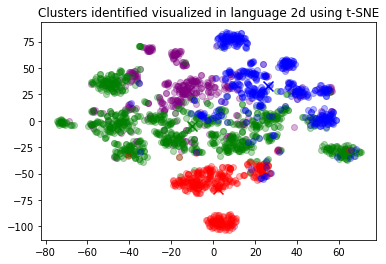

In [ ]:
for category, color in enumerate(["purple", "green", "red", "blue"]):
    xs = np.array(x)[OXO_df.Cluster == category]
    ys = np.array(y)[OXO_df.Cluster == category]
    plt.scatter(xs, ys, color=color, alpha=0.3)

    avg_x = xs.mean()
    avg_y = ys.mean()

    plt.scatter(avg_x, avg_y, marker="x", color=color, s=100)
plt.title("Clusters identified visualized in language 2d using t-SNE")

###Cluster Size = 3

In [ ]:
num_clusters = 3
clustering_model = KMeans(n_clusters=num_clusters)
clustering_model.fit(OXO_df["STE_embeddings"].to_list())
cluster_assignment = clustering_model.labels_

In [ ]:
clustered_sentences = [[] for i in range(num_clusters)]
for sentence_id, cluster_id in enumerate(cluster_assignment):
    clustered_sentences[cluster_id].append(OXO_df.combined.values[sentence_id])

In [ ]:
for i, cluster in enumerate(clustered_sentences):
    print("Cluster ", i+1)
    print(cluster)
    print("")

Cluster  1
["Title: totally meh; Content: As a piece of plastic this is perfectly normal. I think it's design leaves a lot to be desired. Keeping the oil and water elements where they belong involves a lot of tipping back and forth while trying not to spill the contents. When you get down to the margin between the two the spout does a bad job of keeping the oil and water separate. I wanted to use it for clarifying butter and it's almost useless for that (it's better to put the butter in a small pitcher with a spout). For separating gravy it's not so great either. The colander built into the lid clogs with the big chunks and lets all the fines right through. And it's plastic. I haven't put super hot oil through it and that's because I don't want to melt it. So I have to prescreen out the solids with a metal mesh strainer. So then, what's the point of buying this?", "Title: IT DOESN'T WORK VERY WELL; Content: I'm going to buy the 2 cup one. This one, well, I can't figure out how it's sup

In [ ]:
OXO_df["Cluster"] = cluster_assignment
OXO_df.groupby("Cluster").rating.mean().sort_values()

<ipython-input-165-4aed4b810767>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  OXO_df["Cluster"] = cluster_assignment


Cluster
1    3.023622
2    3.055606
0    3.475389
Name: rating, dtype: float64

In [ ]:
matrix = np.vstack(OXO_df.STE_embeddings.values)
matrix.shape

(2250, 384)

In [ ]:
from sklearn.manifold import TSNE
import matplotlib
import matplotlib.pyplot as plt

In [ ]:
tsne = TSNE(
    n_components=2, perplexity=15, random_state=42, init="random", learning_rate=200
)
vis_dims2 = tsne.fit_transform(matrix)

In [ ]:
x = [x for x, y in vis_dims2]
y = [y for x, y in vis_dims2]

<ipython-input-170-036d6c4af744>:6: RuntimeWarning: Mean of empty slice.
  avg_x = xs.mean()
/usr/local/lib/python3.8/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
<ipython-input-170-036d6c4af744>:7: RuntimeWarning: Mean of empty slice.
  avg_y = ys.mean()


Text(0.5, 1.0, 'Clusters identified visualized in language 2d using t-SNE')

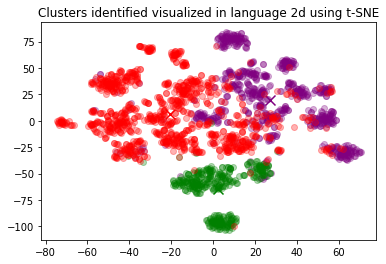

In [ ]:
for category, color in enumerate(["purple", "green", "red", "blue"]):
    xs = np.array(x)[OXO_df.Cluster == category]
    ys = np.array(y)[OXO_df.Cluster == category]
    plt.scatter(xs, ys, color=color, alpha=0.3)

    avg_x = xs.mean()
    avg_y = ys.mean()

    plt.scatter(avg_x, avg_y, marker="x", color=color, s=100)
plt.title("Clusters identified visualized in language 2d using t-SNE")

 ## Cluster size = 2

In [ ]:
num_clusters = 2
clustering_model = KMeans(n_clusters=num_clusters)
clustering_model.fit(OXO_df["STE_embeddings"].to_list())
cluster_assignment = clustering_model.labels_

In [ ]:
clustered_sentences = [[] for i in range(num_clusters)]
for sentence_id, cluster_id in enumerate(cluster_assignment):
    clustered_sentences[cluster_id].append(OXO_df.combined.values[sentence_id])

In [ ]:
for i, cluster in enumerate(clustered_sentences):
    print("Cluster ", i+1)
    print(cluster)
    print("")

Cluster  1
['Title: At first I loved this brush; Content: At first I loved this brush, as it was exactly what I needed & works perfectly to clean all sizes of bottles. Unfortunately rust stains have appeared at the base of the bristles! At first they looked like they had food stains, but to my dismay the stains are in fact rust! Totally unacceptable for a kitchen tool & a complete waste of $. Don"t buy this product, no quality control.', 'Title: too soft; Content: I use it to wash dishes off before they go in the dishwasher...I will throw it away and buy a Rubbermaid bottle brush lik I have before, I should have sent it back but decided to give it a try.........waste of money dont buy it......I have an OXO toilet brush and it works great???????', 'Title: Meh; Content: This is not a good scrub bottle brush, for my needs at least. The bristles are way too soft, they feel softer than a newborn baby brush. This still does clean but not if you have something stubborn to remove like dried on

In [ ]:
OXO_df["Cluster"] = cluster_assignment
OXO_df.groupby("Cluster").rating.mean().sort_values()

<ipython-input-174-4aed4b810767>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  OXO_df["Cluster"] = cluster_assignment


Cluster
0    3.036649
1    3.226445
Name: rating, dtype: float64

In [ ]:
matrix = np.vstack(OXO_df.STE_embeddings.values)
matrix.shape

(2250, 384)

In [ ]:
from sklearn.manifold import TSNE
import matplotlib
import matplotlib.pyplot as plt

In [ ]:
tsne = TSNE(
    n_components=2, perplexity=15, random_state=42, init="random", learning_rate=200
)
vis_dims2 = tsne.fit_transform(matrix)

In [ ]:
x = [x for x, y in vis_dims2]
y = [y for x, y in vis_dims2]

Text(0.5, 1.0, 'Clusters identified visualized in language 2d using t-SNE')

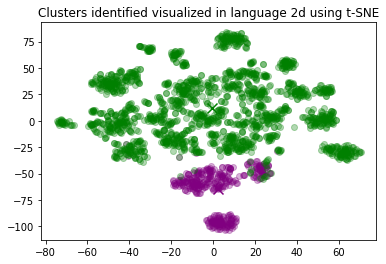

In [ ]:
for category, color in enumerate(["purple", "green"]):
    xs = np.array(x)[OXO_df.Cluster == category]
    ys = np.array(y)[OXO_df.Cluster == category]
    plt.scatter(xs, ys, color=color, alpha=0.3)

    avg_x = xs.mean()
    avg_y = ys.mean()

    plt.scatter(avg_x, avg_y, marker="x", color=color, s=100)
plt.title("Clusters identified visualized in language 2d using t-SNE")

## Utopia Kitchen

In [ ]:
utopia_df = df.loc[df["brand"] == "Utopia Kitchen"]

In [ ]:
utopia_df

,review_id,review_header,review_text,rating,review_posted_date,is_verified,reviews_count,brand,combined,STE_embeddings
25191,RK5CHR0RS08UU,Inconsistant and uneven.,I ordered 3 of these packages. I plan to print...,1.0,"November 2, 2017",1.0,388.0,Utopia Kitchen,Title: Inconsistant and uneven.; Content: I or...,"[-7.7431e-02, 3.6763e-03, -2.5945e-02, 6.483..."
25192,R1Z4GMUJH7ZNFP,Not 100% Cotton,"While these are labeled as 100% cotton, the ac...",1.0,"July 24, 2020",1.0,388.0,Utopia Kitchen,Title: Not 100% Cotton; Content: While these a...,"[-2.6953e-02, 2.0354e-02, -7.5716e-02, 6.883..."
25193,R2JUD4RSVOD0H3,I'm pretty disappointed and will continue sear...,I read the reviews and there were so many fabu...,1.0,"September 28, 2016",1.0,388.0,Utopia Kitchen,Title: I'm pretty disappointed and will contin...,"[-3.2148e-02, 1.0091e-02, 4.9784e-02, 4.664..."
25194,R1WGA8R8J5KL8A,These towels are not good for craft projects,I use these towels to make cute kitchen towels...,1.0,"November 1, 2018",1.0,388.0,Utopia Kitchen,Title: These towels are not good for craft pro...,"[-6.3089e-03, -9.6599e-03, -2.3884e-02, -1.393..."
25195,RHU4MFIGWKU60,AWFUL . . . not cut straight - see photo!,I first purchased this exact brand a few years...,1.0,"July 20, 2019",1.0,388.0,Utopia Kitchen,Title: AWFUL . . . not cut straight - see phot...,"[-2.8361e-02, -7.1973e-04, -3.2678e-03, 9.402..."
...,...,...,...,...,...,...,...,...,...,...
33848,R3TOX57FQYG94Y,Great product!,I use it every morning for my lemon juice!! Us...,5.0,"April 30, 2016",1.0,100.0,Utopia Kitchen,Title: Great product!; Content: I use it every...,"[-8.1663e-02, 1.0594e-01, -7.9806e-03, 5.229..."
33849,R2JFYKCF1UBYWL,Glad I purchased it,Had same product that was painted green and it...,5.0,"March 16, 2017",1.0,100.0,Utopia Kitchen,Title: Glad I purchased it; Content: Had same ...,"[-8.6600e-02, 7.0503e-02, -1.8593e-02, -5.152..."
33850,R2S18Z3QBXM460,My son loves lemons but waists half of them wi...,My son loves lemons but waists half of them wi...,5.0,"February 10, 2016",1.0,100.0,Utopia Kitchen,Title: My son loves lemons but waists half of ...,"[ 5.4453e-03, 9.9033e-02, 2.3811e-02, 9.213..."
33851,R29AJXCC0EJFIH,hello hello i love this lime squeezer so well ...,hello hello i love this lime squeezer so well ...,5.0,"December 10, 2015",1.0,100.0,Utopia Kitchen,Title: hello hello i love this lime squeezer s...,"[-1.3315e-01, 2.8395e-02, 3.7832e-02, 5.374..."


In [ ]:
utopia_df["STE_embeddings"] = utopia_df.STE_embeddings.apply(eval).apply(np.array)

<ipython-input-125-09151313388f>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  utopia_df["STE_embeddings"] = utopia_df.STE_embeddings.apply(eval).apply(np.array)


## Cluster size = 5

In [ ]:
# Perform kmean clustering
num_clusters = 5
clustering_model = KMeans(n_clusters=num_clusters)
clustering_model.fit(utopia_df["STE_embeddings"].to_list())
cluster_assignment = clustering_model.labels_

In [ ]:
clustered_sentences = [[] for i in range(num_clusters)]
for sentence_id, cluster_id in enumerate(cluster_assignment):
    clustered_sentences[cluster_id].append(utopia_df.combined.values[sentence_id])

In [ ]:
for i, cluster in enumerate(clustered_sentences):
    print("Cluster ", i+1)
    print(cluster)
    print("")

Cluster  1
['Title: Pots Are Not Dishwasher Safe!!; Content: Ordered these pots to use on my new induction cooktop. Items were nicely packaged and arrived undamaged. Wanted to use these pots right away so placed them in the dishwasher for cleaning before use. Description states pots are “dishwasher safe”. Just took them out of the dishwasher and the bottom of the pots are discolored and looked burned and the rims looks like they have melted in places.Even the aluminum band at the base of the handle is discolored. I have never had this happen to any of my cookware before and I’ve been preparing meals with different cookware for 50 years! Wonder what they’d look like after a few uses? I will be contacting the seller for replacement or refund.', 'Title: Not induction capable, poor customer service; Content: The description written by the company clearly states that this pot is induction capable. Amazon does not write the product description. Clearly deceptive advertising. I tried it on my

In [ ]:
utopia_df["Cluster"] = cluster_assignment
utopia_df.groupby("Cluster").rating.mean().sort_values()

<ipython-input-129-1e0bb4333312>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  utopia_df["Cluster"] = cluster_assignment


Cluster
1    2.905967
0    3.116935
2    3.217848
4    3.261993
3    3.285714
Name: rating, dtype: float64

In [ ]:
matrix = np.vstack(utopia_df.STE_embeddings.values)
matrix.shape

(2347, 384)

In [ ]:
from sklearn.manifold import TSNE
import matplotlib
import matplotlib.pyplot as plt

In [ ]:
tsne = TSNE(
    n_components=2, perplexity=15, random_state=42, init="random", learning_rate=200
)
vis_dims2 = tsne.fit_transform(matrix)

In [ ]:
x = [x for x, y in vis_dims2]
y = [y for x, y in vis_dims2]

Text(0.5, 1.0, 'Clusters identified visualized in language 2d using t-SNE')

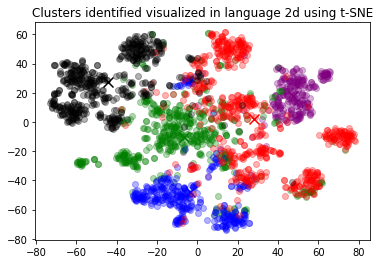

In [ ]:
for category, color in enumerate(["purple", "green","blue","red","black"]):
    xs = np.array(x)[utopia_df.Cluster == category]
    ys = np.array(y)[utopia_df.Cluster == category]
    plt.scatter(xs, ys, color=color, alpha=0.3)

    avg_x = xs.mean()
    avg_y = ys.mean()

    plt.scatter(avg_x, avg_y, marker="x", color=color, s=100)
plt.title("Clusters identified visualized in language 2d using t-SNE")

#### Cluster Size = 4

In [ ]:
# Perform kmean clustering
num_clusters = 4
clustering_model = KMeans(n_clusters=num_clusters)
clustering_model.fit(utopia_df["STE_embeddings"].to_list())
cluster_assignment = clustering_model.labels_

In [ ]:
clustered_sentences = [[] for i in range(num_clusters)]
for sentence_id, cluster_id in enumerate(cluster_assignment):
    clustered_sentences[cluster_id].append(utopia_df.combined.values[sentence_id])

In [ ]:
for i, cluster in enumerate(clustered_sentences):
    print("Cluster ", i+1)
    print(cluster)
    print("")

Cluster  1
["Title: Inconsistant and uneven.; Content: I ordered 3 of these packages. I plan to print on them and sell them at craft shows. I'm extremely disappointed in the quality and inconsistency. The first package I opened was perfect. No complaints. They were thick and straight and bright white. However the next two packages I opened were extremely thin. I washed them all just as described. Cold water on delicate cycle. And then dried them on delicate (low low setting). Once I was folding them I noticed that the first batch held up great! The other two batches however are so uneven they can't even be folded! Definitely can't print on them! They are also a dingy white color and not as bright white as the first batch. This may be because of how incredibly thin they are. They also are considerably smaller. Maybe I got a couple defective batches?? Either way I cannot use these for the purpose I bought them for which is frustruating considering the money I spent on them.", 'Title: Not

In [ ]:
utopia_df["Cluster"] = cluster_assignment
utopia_df.groupby("Cluster").rating.mean().sort_values()

<ipython-input-138-1e0bb4333312>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  utopia_df["Cluster"] = cluster_assignment


Cluster
1    2.914191
3    3.223650
2    3.251870
0    3.260000
Name: rating, dtype: float64

In [ ]:
matrix = np.vstack(utopia_df.STE_embeddings.values)
matrix.shape

(2347, 384)

In [ ]:
from sklearn.manifold import TSNE
import matplotlib
import matplotlib.pyplot as plt

In [ ]:
tsne = TSNE(
    n_components=2, perplexity=15, random_state=42, init="random", learning_rate=200
)
vis_dims2 = tsne.fit_transform(matrix)

In [ ]:
x = [x for x, y in vis_dims2]
y = [y for x, y in vis_dims2]

<ipython-input-143-124f9693191b>:6: RuntimeWarning: Mean of empty slice.
  avg_x = xs.mean()
/usr/local/lib/python3.8/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
<ipython-input-143-124f9693191b>:7: RuntimeWarning: Mean of empty slice.
  avg_y = ys.mean()


Text(0.5, 1.0, 'Clusters identified visualized in language 2d using t-SNE')

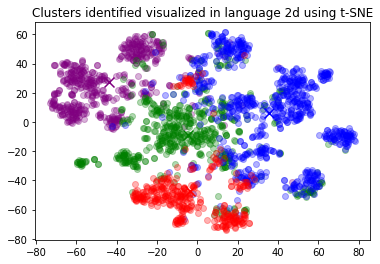

In [ ]:
for category, color in enumerate(["purple", "green","blue","red","black"]):
    xs = np.array(x)[utopia_df.Cluster == category]
    ys = np.array(y)[utopia_df.Cluster == category]
    plt.scatter(xs, ys, color=color, alpha=0.3)

    avg_x = xs.mean()
    avg_y = ys.mean()

    plt.scatter(avg_x, avg_y, marker="x", color=color, s=100)
plt.title("Clusters identified visualized in language 2d using t-SNE")

#### Cluster size = 3

In [ ]:
num_clusters = 3
clustering_model = KMeans(n_clusters=num_clusters)
clustering_model.fit(utopia_df["STE_embeddings"].to_list())
cluster_assignment = clustering_model.labels_

In [ ]:
clustered_sentences = [[] for i in range(num_clusters)]
for sentence_id, cluster_id in enumerate(cluster_assignment):
    clustered_sentences[cluster_id].append(utopia_df.combined.values[sentence_id])

In [ ]:
for i, cluster in enumerate(clustered_sentences):
    print("Cluster ", i+1)
    print(cluster)
    print("")

Cluster  1
["Title: Inconsistant and uneven.; Content: I ordered 3 of these packages. I plan to print on them and sell them at craft shows. I'm extremely disappointed in the quality and inconsistency. The first package I opened was perfect. No complaints. They were thick and straight and bright white. However the next two packages I opened were extremely thin. I washed them all just as described. Cold water on delicate cycle. And then dried them on delicate (low low setting). Once I was folding them I noticed that the first batch held up great! The other two batches however are so uneven they can't even be folded! Definitely can't print on them! They are also a dingy white color and not as bright white as the first batch. This may be because of how incredibly thin they are. They also are considerably smaller. Maybe I got a couple defective batches?? Either way I cannot use these for the purpose I bought them for which is frustruating considering the money I spent on them.", 'Title: Not

In [ ]:
utopia_df["Cluster"] = cluster_assignment
utopia_df.groupby("Cluster").rating.mean().sort_values()

<ipython-input-147-1e0bb4333312>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  utopia_df["Cluster"] = cluster_assignment


Cluster
2    2.956652
1    3.218360
0    3.294964
Name: rating, dtype: float64

In [ ]:
matrix = np.vstack(utopia_df.STE_embeddings.values)
matrix.shape

(2347, 384)

In [ ]:
from sklearn.manifold import TSNE
import matplotlib
import matplotlib.pyplot as plt

In [ ]:
tsne = TSNE(
    n_components=2, perplexity=15, random_state=42, init="random", learning_rate=200
)
vis_dims2 = tsne.fit_transform(matrix)

In [ ]:
x = [x for x, y in vis_dims2]
y = [y for x, y in vis_dims2]

<ipython-input-152-124f9693191b>:6: RuntimeWarning: Mean of empty slice.
  avg_x = xs.mean()
/usr/local/lib/python3.8/dist-packages/numpy/core/_methods.py:189: RuntimeWarning: invalid value encountered in true_divide
  ret = ret.dtype.type(ret / rcount)
<ipython-input-152-124f9693191b>:7: RuntimeWarning: Mean of empty slice.
  avg_y = ys.mean()


Text(0.5, 1.0, 'Clusters identified visualized in language 2d using t-SNE')

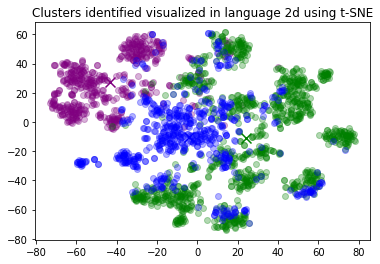

In [ ]:
for category, color in enumerate(["purple", "green","blue","red","black"]):
    xs = np.array(x)[utopia_df.Cluster == category]
    ys = np.array(y)[utopia_df.Cluster == category]
    plt.scatter(xs, ys, color=color, alpha=0.3)

    avg_x = xs.mean()
    avg_y = ys.mean()

    plt.scatter(avg_x, avg_y, marker="x", color=color, s=100)
plt.title("Clusters identified visualized in language 2d using t-SNE")

# Agglomerative Analysis
---
**Author: Jude Essene** 

In [ ]:
df = pd.read_csv("/content/drive/MyDrive/Product Reviews/Dataset/chunk_1_STE_embeddings.csv")

In [ ]:
from sklearn.cluster import AgglomerativeClustering

In [ ]:
df["brand"].value_counts()

Wildone               2865
Utopia Kitchen        2347
OXO                   2250
SIGNORA WARE          2194
Vtopmart              2013
                      ... 
Fullstar                38
BLACKSMITH FAMILY       30
Vriksasana Posture      10
elv                      8
Gaggle                   3
Name: brand, Length: 172, dtype: int64

In [ ]:
wildone_df = df.loc[df["brand"] == "Wildone"]

In [ ]:
wildone_df["STE_embeddings"] = wildone_df.STE_embeddings.apply(eval).apply(np.array)

<ipython-input-130-0edb5aabc77e>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wildone_df["STE_embeddings"] = wildone_df.STE_embeddings.apply(eval).apply(np.array)


In [ ]:
corpus_embeddings = wildone_df["STE_embeddings"].to_list() /  np.linalg.norm(wildone_df["STE_embeddings"].to_list(), axis=1, keepdims=True)

In [ ]:
# Perform kmean clustering
clustering_model = AgglomerativeClustering(n_clusters=None, distance_threshold=1.5) #, affinity='cosine', linkage='average', distance_threshold=0.4)
clustering_model.fit(corpus_embeddings)
cluster_assignment = clustering_model.labels_

In [ ]:
clustered_sentences = {}
for sentence_id, cluster_id in enumerate(cluster_assignment):
    if cluster_id not in clustered_sentences:
        clustered_sentences[cluster_id] = []

    clustered_sentences[cluster_id].append(wildone_df.combined.iloc[sentence_id])

In [ ]:
for i, cluster in clustered_sentences.items():
    print("Cluster ", i+1)
    print(cluster)
    print("")

Cluster  14
['Title: BUYER BEWARE, Lousy warrantee; Content: I ordered a set and a pal bought another on my enthusiasm. BUT the .63 QT bowl developed two cracks after a month. Amazon say we are outside the 30 day return date and the supplier refers back to Amazon. So we have a bowl with a Dangerously SHARP EDGE and no one wants to step up to support the product. BUYER BEWARE', 'Title: Missing pieces; Content: My set came missing a bowl and a grater attachment. A little disappointed considering how long I waited and the fact that it’s the second largest missing which I would have used a lot more than the tiny ones', 'Title: The large bowl seems flimsy, but the rest of the set is good.; Content: I’ve only used the large bowl a handful of times, but while shredding cheese with the cut-out lid feature, the bowl split. I was disappointed as I thought this was a quality set. I’m very happy with the rest of the set! I’m not sure how to initiate a return/replacement.', 'Title: Do not like the 

# Fast Clustering Application - Authour: Amir Banasadi

In [ ]:
import pandas as pd
import numpy as np

In [ ]:
df = pd.read_csv("/content/drive/MyDrive/STE_embeddings.csv")

***Creating color list for visualization***

In [ ]:
import random

def coloring(a):
  clr_lst = ["#F7BFBD","#FF3333","#080F0F" ,"#FCFBE8","#4E504E","#FF8D38","#FFCA33","#FFF933","#05B4F7","#037C74","#066F38" , "#C0FF33" , "#33FF33" , "#0047FF" , "#082160" ,"#49448A", "#B802FE" ,"#B996C6", "#FE02D0" , "#FE026B"]
  clrs = []
  for i in range(a):
    n = random.choice(clr_lst)
    clrs.append(n)
    clr_lst.remove(n)
  return clrs


In [ ]:
df["brand"].unique()

In [ ]:
import pdb

In [ ]:
df['brand'].value_counts()

Wildone               2865
Utopia Kitchen        2347
OXO                   2250
SIGNORA WARE          2194
Vtopmart              2013
                      ... 
Fullstar                38
BLACKSMITH FAMILY       30
Vriksasana Posture      10
elv                      8
Gaggle                   3
Name: brand, Length: 172, dtype: int64

##Fast Clustering

In [ ]:
!pip install -U sentence-transformers

In [ ]:
from sentence_transformers import SentenceTransformer, util
import torch

## ***Wildone Brand***

In [ ]:
wildone_df = df.loc[df["brand"] == "Wildone"]

In [ ]:
wildone_df["STE_embeddings"] = wildone_df.STE_embeddings.apply(eval).apply(np.array)

<ipython-input-13-0edb5aabc77e>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wildone_df["STE_embeddings"] = wildone_df.STE_embeddings.apply(eval).apply(np.array)


In [ ]:
pt_tensor_from_list = torch.FloatTensor(wildone_df.STE_embeddings.to_list())

<ipython-input-14-6330f5175345>:1: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at ../torch/csrc/utils/tensor_new.cpp:230.)
  pt_tensor_from_list = torch.FloatTensor(wildone_df.STE_embeddings.to_list())


## **Clustering with Min_Size of 28 and threshold = 0.75**

In [ ]:
clusters = util.community_detection(pt_tensor_from_list, min_community_size=28, threshold=0.75)
len(clusters)

6

In [ ]:
wildone_df["Cluster"] = [0 for i in range(len(wildone_df))]

for i in clusters:
  for j in i:
    wildone_df.at[wildone_df.index[j] ,'Cluster'] = clusters.index(i) + 1

<ipython-input-16-92cb2a3a2935>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  wildone_df["Cluster"] = [0 for i in range(len(wildone_df))]


In [ ]:
new = wildone_df[wildone_df.Cluster!=0]

In [ ]:
#Print for all clusters the top 3 and bottom 3 elements
for i, cluster in enumerate(clusters):
    print("\nCluster {}, #{} Elements ".format(i+1, len(cluster)))
    for sentence_id in cluster[0:3]:
        print("\t", wildone_df.combined.iloc[sentence_id])
    print("\t", "...")
    for sentence_id in cluster[-3:]:
        print("\t", wildone_df.combined.iloc[sentence_id])

## **2D visualization with Min_Size of 28 and threshold = 0.75**

In [ ]:
new.groupby("Cluster").rating.mean().sort_values()

Cluster
4    1.921053
3    2.857143
1    2.954128
5    3.941176
2    4.409091
6    4.766667
Name: rating, dtype: float64

In [ ]:
matrix = np.vstack(new.STE_embeddings.values)
matrix.shape

(319, 384)

In [ ]:
from sklearn.manifold import TSNE
import matplotlib
import matplotlib.pyplot as plt

In [ ]:
tsne = TSNE(
    n_components=2, perplexity=10, random_state=42, init="random", learning_rate=500
)
vis_dims2 = tsne.fit_transform(matrix)

In [ ]:
x = [x for x, y in vis_dims2]
y = [y for x, y in vis_dims2]

Text(0.5, 1.0, 'Clusters identified visualized in language 2d using t-SNE')

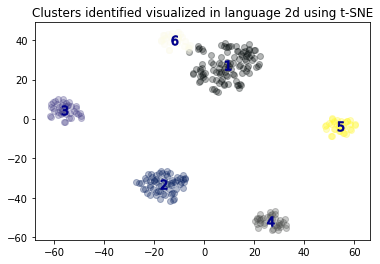

In [ ]:
for category, color in enumerate(coloring(len(clusters))):
    xs = np.array(x)[new.Cluster == category+1]
    ys = np.array(y)[new.Cluster == category+1]
    plt.scatter(xs, ys, color=color, alpha=0.3)

    avg_x = xs.mean()
    avg_y = ys.mean()

    plt.scatter(avg_x, avg_y, marker=f'${category+1}$', color='darkblue', s=90)
plt.title("Clusters identified visualized in language 2d using t-SNE")

## **3D visualization with Min_Size of 28 and threshold = 0.75**

In [ ]:
tsne = TSNE(
    n_components=3, perplexity=15, random_state=42, init="random", learning_rate=200
)
vis_dims3 = tsne.fit_transform(matrix)

In [ ]:
np.random.seed(19680801)

In [ ]:
xn = [x for x, y, z in vis_dims3]
yn = [y for x, y, z in vis_dims3]
zn = [z for x, y, z in vis_dims3]

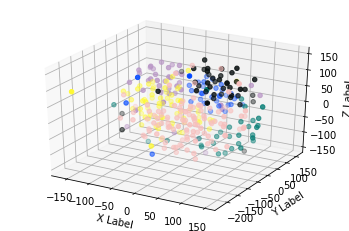

In [ ]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')

for category, color in enumerate(coloring(len(clusters))):
    xs = np.array(xn)[new.Cluster == category+1]
    ys = np.array(yn)[new.Cluster == category+1]
    zs = np.array(zn)[new.Cluster == category+1]

    ax.scatter(xs, ys, zs, color = color)

    avg_x = xs.mean()
    avg_y = ys.mean()
    avg_z = zs.mean()

    # plt.scatter(avg_x, avg_y, avg_z, marker="x", color=color, s=100)

ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

plt.show()
# plt.title("Clusters identified visualized in language 3d using t-SNE")

## **2D with differing parameters of 3D embeddings**

### **X,Y**

Text(0.5, 1.0, 'Clusters identified visualized in language 2d using t-SNE')

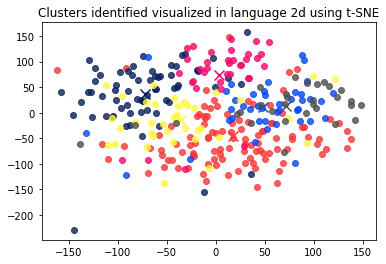

In [ ]:
for category, color in enumerate(coloring(len(clusters))):
    xs = np.array(xn)[new.Cluster == category+1]
    ys = np.array(yn)[new.Cluster == category+1]
    plt.scatter(xs, ys, color=color, alpha=0.8)

    avg_x = xs.mean()
    avg_y = ys.mean()

    plt.scatter(avg_x, avg_y, marker="x", color=color, s=100)
plt.title("Clusters identified visualized in language 2d using t-SNE")

### **X,Z**

Text(0.5, 1.0, 'Clusters identified visualized in language 2d using t-SNE')

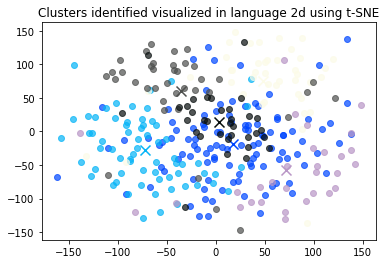

In [ ]:
for category, color in enumerate(coloring(len(clusters))):
    xs = np.array(xn)[new.Cluster == category+1]
    zs= np.array(zn)[new.Cluster == category+1]
    plt.scatter(xs, zs, color=color, alpha=0.7)

    avg_x = xs.mean()
    avg_z = zs.mean()

    plt.scatter(avg_x, avg_z, marker="x", color=color, s=100)
plt.title("Clusters identified visualized in language 2d using t-SNE")

### **Y,Z**

Text(0.5, 1.0, 'Clusters identified visualized in language 2d using t-SNE')

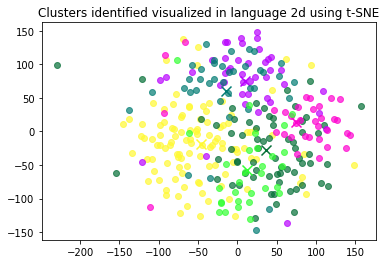

In [ ]:
for category, color in enumerate(coloring(len(clusters))):
    ys = np.array(yn)[new.Cluster == category+1]
    zs = np.array(zn)[new.Cluster == category+1]
    plt.scatter(ys, zs, color=color, alpha=0.7)

    avg_y = ys.mean()
    avg_z = zs.mean()

    plt.scatter(avg_y, avg_z, marker="x", color=color, s=100)
plt.title("Clusters identified visualized in language 2d using t-SNE")

## **Utopia Kitchen Brand**

In [ ]:
uk_df = df.loc[df["brand"] == "Utopia Kitchen"]

In [ ]:
uk_df["STE_embeddings"] = uk_df.STE_embeddings.apply(eval).apply(np.array)

<ipython-input-35-1201d59b273d>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  uk_df["STE_embeddings"] = uk_df.STE_embeddings.apply(eval).apply(np.array)


In [ ]:
uk_tensor_from_list = torch.FloatTensor(uk_df.STE_embeddings.to_list())

## **Clustering with Min_Size of 28 and threshold = 0.75**

In [ ]:
uk_clusters = util.community_detection(uk_tensor_from_list, min_community_size=13, threshold=0.75)
len(uk_clusters)

7

In [ ]:
uk_df["Cluster"] = [0 for i in range(len(uk_df))]

for z in uk_clusters:
  for v in z:
    # print(j)
    uk_df.at[uk_df.index[v],"Cluster"] = uk_clusters.index(z) + 1

<ipython-input-38-bd5e593b8e84>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  uk_df["Cluster"] = [0 for i in range(len(uk_df))]


In [ ]:
new_uk = uk_df[uk_df.Cluster!=0]

## **2D visualization with Min_Size of 28 and threshold = 0.75**

In [ ]:
new_uk.groupby("Cluster").rating.mean().sort_values()

Cluster
6    3.000000
5    3.071429
2    3.190476
7    3.230769
1    3.500000
3    4.176471
4    4.250000
Name: rating, dtype: float64

In [ ]:
matrix_uk = np.vstack(new_uk.STE_embeddings.values)

In [ ]:
tsne = TSNE(
    n_components=2, perplexity=5, random_state=42, init="random", learning_rate=200
)
vis_uk_dims2 = tsne.fit_transform(matrix_uk)

In [ ]:
x_uk = [x for x, y in vis_uk_dims2]
y_uk = [y for x, y in vis_uk_dims2]

Text(0.5, 1.0, 'Clusters identified visualized in language 2d using t-SNE')

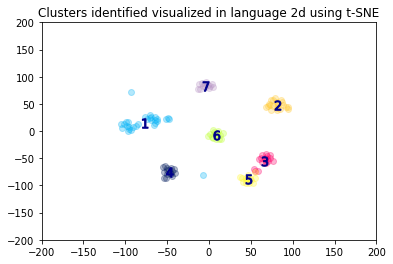

In [ ]:
for category, color in enumerate(coloring(len(uk_clusters))):
    xs_uk = np.array(x_uk)[new_uk.Cluster == category+1]
    ys_uk = np.array(y_uk)[new_uk.Cluster == category+1]
    plt.scatter(xs_uk, ys_uk, color=color, alpha=0.3)

    avg_xp = xs_uk.mean()
    avg_yp = ys_uk.mean()
    plt.ylim([-200, 200])
    plt.xlim([-200, 200])
    plt.scatter(avg_xp, avg_yp, marker=f'${category+1}$', color='darkblue', s=90)
plt.title("Clusters identified visualized in language 2d using t-SNE")

## **3D visualization with Min_Size of 28 and threshold = 0.75**

In [ ]:
tsne = TSNE(
    n_components=3, perplexity=15, random_state=42, init="random", learning_rate=200
)
vis_uk_dims3 = tsne.fit_transform(matrix_uk)

In [ ]:
x3_uk = [x for x, y, z in vis_uk_dims3]
y3_uk = [y for x, y, z in vis_uk_dims3]
z3_uk = [z for x, y, z in vis_uk_dims3]

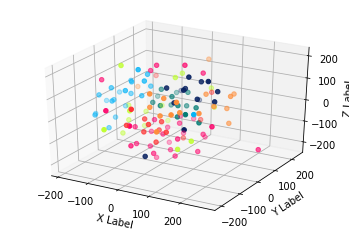

In [ ]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')

for category, color in enumerate(coloring(len(uk_clusters))):
    xs3 = np.array(x3_uk)[new_uk.Cluster == category+1]
    ys3 = np.array(y3_uk)[new_uk.Cluster == category+1]
    zs3 = np.array(z3_uk)[new_uk.Cluster == category+1]

    ax.scatter(xs3, ys3, zs3, color = color)

    avg_x3 = xs3.mean()
    avg_y3 = ys3.mean()
    avg_z3 = zs3.mean()

    # plt.scatter(avg_x, avg_y, avg_z, marker="x", color=color, s=100)

ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

plt.show()
# plt.title("Clusters identified visualized in language 3d using t-SNE")

## **2D with differing parameters of 3D embeddings**

### **X,Y**

Text(0.5, 1.0, 'Clusters identified visualized in language 2d using t-SNE')

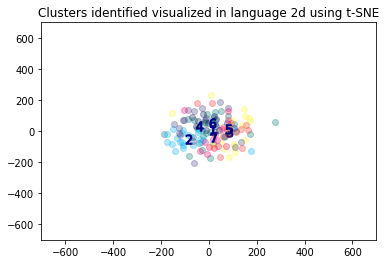

In [ ]:
for category, color in enumerate(coloring(len(uk_clusters))):
  xs3 = np.array(x3_uk)[new_uk.Cluster == category+1]
  ys3 = np.array(y3_uk)[new_uk.Cluster == category+1]
  plt.scatter(xs3, ys3, color=color, alpha=0.3)

  avg_xp = xs3.mean()
  avg_yp = ys3.mean()
  plt.ylim([-700, 700])
  plt.xlim([-700, 700])
  plt.scatter(avg_xp, avg_yp, marker=f'${category+1}$', color='darkblue', s=90)
plt.title("Clusters identified visualized in language 2d using t-SNE")

### **X,Z**

Text(0.5, 1.0, 'Clusters identified visualized in language 2d using t-SNE')

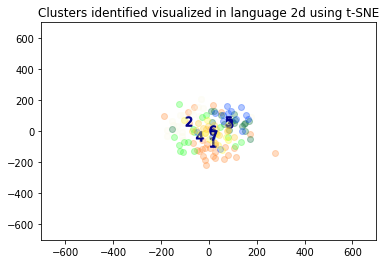

In [ ]:
for category, color in enumerate(coloring(len(uk_clusters))):
  xs3 = np.array(x3_uk)[new_uk.Cluster == category+1]
  zs3 = np.array(z3_uk)[new_uk.Cluster == category+1]
  plt.scatter(xs3, zs3, color=color, alpha=0.3)

  avg_xp = xs3.mean()
  avg_zp = zs3.mean()
  plt.ylim([-700, 700])
  plt.xlim([-700, 700])
  plt.scatter(avg_xp, avg_zp, marker=f'${category+1}$', color='darkblue', s=90)
plt.title("Clusters identified visualized in language 2d using t-SNE")

### **Y,Z**

Text(0.5, 1.0, 'Clusters identified visualized in language 2d using t-SNE')

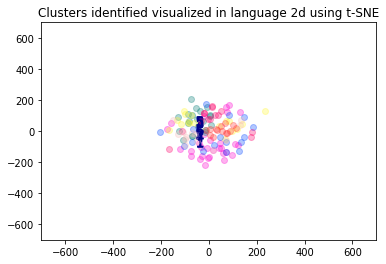

In [ ]:
for category, color in enumerate(coloring(len(uk_clusters))):
  ys3 = np.array(y3_uk)[new_uk.Cluster == category+1]
  zs3 = np.array(z3_uk)[new_uk.Cluster == category+1]
  plt.scatter(ys3, zs3, color=color, alpha=0.3)

  avg_xp = ys3.mean()
  avg_zp = zs3.mean()
  plt.ylim([-700, 700])
  plt.xlim([-700, 700])
  plt.scatter(avg_yp, avg_zp, marker=f'${category+1}$', color='darkblue', s=90)
plt.title("Clusters identified visualized in language 2d using t-SNE")

## **OXO Brand**

In [ ]:
OXO_df = df.loc[df["brand"] == "OXO"]
OXO_df["STE_embeddings"] = OXO_df.STE_embeddings.apply(eval).apply(np.array)

<ipython-input-52-f7b642f54eac>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  OXO_df["STE_embeddings"] = OXO_df.STE_embeddings.apply(eval).apply(np.array)


In [ ]:
OXO_tensor_from_list = torch.FloatTensor(OXO_df.STE_embeddings.to_list())

## **Clustering with Min_Size of 28 and threshold = 0.75** **bold text**

In [ ]:
OXO_clusters = util.community_detection(OXO_tensor_from_list, min_community_size=15, threshold=0.75)
len(OXO_clusters)

7

In [ ]:
OXO_df["Cluster"] = [0 for i in range(len(OXO_df))]

for z in OXO_clusters:
  for v in z:
    # print(j)
    OXO_df.at[OXO_df.index[v],"Cluster"] = OXO_clusters.index(z) + 1

<ipython-input-55-7a0d5e735863>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  OXO_df["Cluster"] = [0 for i in range(len(OXO_df))]


In [ ]:
new_OXO = OXO_df[OXO_df.Cluster!=0]

## **2D visualization with Min_Size of 28 and threshold = 0.75**

In [ ]:
new_OXO.groupby("Cluster").rating.mean().sort_values()

Cluster
5    2.892857
6    3.040000
1    3.163265
2    3.382353
3    3.419355
4    3.714286
7    4.200000
Name: rating, dtype: float64

In [ ]:
matrix_OXO = np.vstack(new_OXO.STE_embeddings.values)

In [ ]:
tsne_OXO = TSNE(
    n_components=2, perplexity=5, random_state=42, init="random", learning_rate=200
)
vis_dims_OXO2 = tsne_OXO.fit_transform(matrix_OXO)

In [ ]:
xo = [x for x, y in vis_dims_OXO2]
yo = [y for x, y in vis_dims_OXO2]

Text(0.5, 1.0, 'Clusters identified visualized in language 2d using t-SNE')

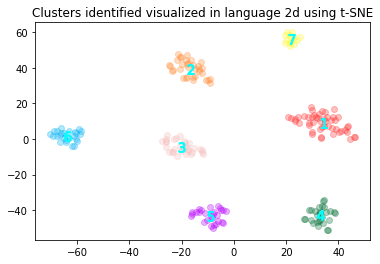

In [ ]:
for category, color in enumerate(coloring(len(OXO_clusters))):
    xk = np.array(xo)[new_OXO.Cluster == category + 1]
    yk = np.array(yo)[new_OXO.Cluster == category + 1]
    plt.scatter(xk, yk, color=color, alpha=0.3)

    avg_xo = xk.mean()
    avg_yo = yk.mean()

    plt.scatter(avg_xo, avg_yo, marker=f'${category+1}$', color="cyan", s=100)
plt.title("Clusters identified visualized in language 2d using t-SNE")

## **3D visualization with Min_Size of 28 and threshold = 0.75**

In [ ]:
tsne = TSNE(
    n_components=3, perplexity=15, random_state=42, init="random", learning_rate=200
)
vis_oxo_dims3 = tsne.fit_transform(matrix_OXO)

In [ ]:
x3_oxo = [x for x, y, z in vis_oxo_dims3]
y3_oxo= [y for x, y, z in vis_oxo_dims3]
z3_oxo = [z for x, y, z in vis_oxo_dims3]

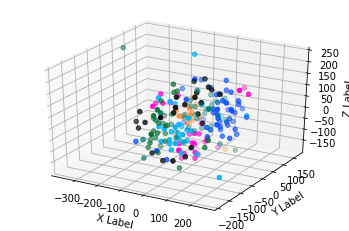

In [ ]:
fig = plt.figure()
ax = fig.add_subplot(projection='3d')

for category, color in enumerate(coloring(len(OXO_clusters))):
    xo3 = np.array(x3_oxo)[new_OXO.Cluster == category+1]
    yo3 = np.array(y3_oxo)[new_OXO.Cluster == category+1]
    zo3 = np.array(z3_oxo)[new_OXO.Cluster == category+1]

    ax.scatter(xo3, yo3, zo3, color = color)

    avg_x3 = xo3.mean()
    avg_y3 = yo3.mean()
    avg_z3 = zo3.mean()

    # plt.scatter(avg_x, avg_y, avg_z, marker="x", color=color, s=100)

ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

plt.show()
# plt.title("Clusters identified visualized in language 2d using t-SNE")

## **2D with differing parameters of 3D embeddings**

### **X,Y**

Text(0.5, 1.0, 'Clusters identified visualized in language 2d using t-SNE')

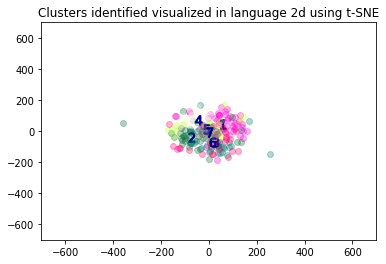

In [ ]:
for category, color in enumerate(coloring(len(OXO_clusters))):
  xo3 = np.array(x3_oxo)[new_OXO.Cluster == category+1]
  yo3 = np.array(y3_oxo)[new_OXO.Cluster == category+1]
  plt.scatter(xo3, yo3, color=color, alpha=0.3)

  avg_xw = xo3.mean()
  avg_yw = yo3.mean()
  plt.ylim([-700, 700])
  plt.xlim([-700, 700])
  plt.scatter(avg_xw, avg_yw, marker=f'${category+1}$', color='darkblue', s=90)
plt.title("Clusters identified visualized in language 2d using t-SNE")

### **X,Z**

Text(0.5, 1.0, 'Clusters identified visualized in language 2d using t-SNE')

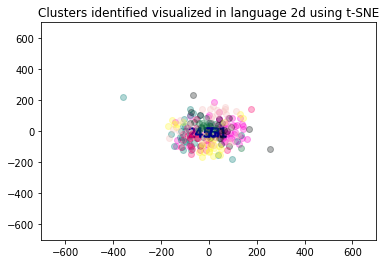

In [ ]:
for category, color in enumerate(coloring(len(OXO_clusters))):
  xo3 = np.array(x3_oxo)[new_OXO.Cluster == category+1]
  zo3 = np.array(z3_oxo)[new_OXO.Cluster == category+1]
  plt.scatter(xo3, zo3, color=color, alpha=0.3)

  avg_xq = xo3.mean()
  avg_yq = yo3.mean()

  plt.ylim([-700, 700])
  plt.xlim([-700, 700])
  plt.scatter(avg_xq, avg_yq, marker=f'${category+1}$', color='darkblue', s=90)
plt.title("Clusters identified visualized in language 2d using t-SNE")

### **Y,Z**

Text(0.5, 1.0, 'Clusters identified visualized in language 2d using t-SNE')

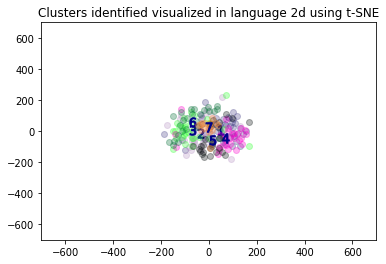

In [ ]:
for category, color in enumerate(coloring(len(OXO_clusters))):
  zo3 = np.array(z3_oxo)[new_OXO.Cluster == category+1]
  yo3 = np.array(y3_oxo)[new_OXO.Cluster == category+1]
  plt.scatter(yo3, zo3, color=color, alpha=0.3)

  avg_zz = zo3.mean()
  avg_yy = yo3.mean()
  plt.ylim([-700, 700])
  plt.xlim([-700, 700])
  plt.scatter(avg_yy, avg_zz, marker=f'${category+1}$', color='darkblue', s=90)
plt.title("Clusters identified visualized in language 2d using t-SNE")

# Combing Review's Valence & Arousal with Context - Author: Usama Shahid

**Combine topic clusters with two dimensions of emotions (arousal and valence)** 

**emotions are distributed in a two-dimensional circular space, containing arousal and valence dimensions**
Arousal represents the vertical axis and valence represents the horizontal axis, while the center of the circle represents a neutral valence and a medium level of arousal.

- Valence (is the review written in a positive or negative mood/style)
- Arousal (from Calm - Exited)
- Context (Service-Specific → Product-Specific) OR Topics 

**GPT3 Embeddings:**
* https://www.askviable.com/blog/why-we-chose-gpt-3-embeddings-for-the-clustering-behind-our-feedback-reports

**Topic Clustering**
* https://github.com/ddangelov/Top2Vec

**Regression Analysis**
* https://github.com/openai/openai-cookbook/blob/main/examples/Regression_using_embeddings.ipynb

**Classification Analysis**
* https://github.com/openai/openai-cookbook/blob/main/examples/Classification_using_embeddings.ipynb

**Classification Model Analysis**
* https://towardsdatascience.com/top-5-metrics-for-evaluating-classification-model-83ede24c7584

![Valence and Arousal](https://drive.google.com/uc?export=view&id=1chWRWB9kg7C_6N_czxLJztSh0VHWI7UX)



In [ ]:
"""
1: Generate, analyse, and compare different embeddings
2: Generate dataset for valence & arousal
3: Train models using classification and regresission for (valence and arousal)
4: Analyze the results of the models using classificaion and regression
(Use tsne, pca etc for reducing dimension and visualizing clusters with embeddings and different Quadrant)
5: Use gpt3 or top-2-vec for context or topic modeling of the reviews AND combine with valence and arousal
6: Visalizing the reviews for explaining using all the collected information
"""

In [ ]:
OpenAI, Embeddings, sklearn, tsne, pca

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 44 kB 2.3 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 147 kB 12.8 MB/s 
  Created wheel for openai: filename=openai-0.25.0-py3-none-any.whl size=55880 sha256=1f3a06df74b0062262ad6a44d9d522d84172ccb21aa2664baeffaa5f8af9d4ae
  Stored in directory: /root/.cache/pip/wheels/4b/92/33/6f57c7aae0b16875267999a50570e81f15eecec577ebe05a2e
Successfully built openai


In [ ]:
class OpenAI:
  openai.api_key = ""

  @retry(exceptions=Exception, tries=RETRY_COUNT, delay=SLEEP_THRESHOLD)
  def get_completion(self, 
                     model: str = "text-davinci-003",
                     prompt: str = "",
                     temperature: float = 0.7,
                     max_tokens: int = 1000,
                     top_p: int = 1,
                     frequency_penalty: float = 0,
                     presence_penalty: float = 0):
    try:
      response = openai.Completion.create(
        model=model,
        prompt=prompt,
        temperature=temperature,
        max_tokens=max_tokens,
        top_p=top_p,
        frequency_penalty=frequency_penalty,
        presence_penalty=presence_penalty
      )

      return str(response["choices"][0]["text"]).strip()

    except Exception as e:
      print(f"Error(OpenAI: get_commpletion): ", e)
      

  
  def get_valence_labelling_prompt(self, 
                                   review_text: str, 
                                   review_header: str):
    
    st = "Decide based on Review Header and Review Text whether the Review's Valence is positive, neutral, or negative."
    st += f"\nReview Header: {review_text}"
    st += f"\nReview Text: {review_text}"
    st += "\nValence:"

    return st

  def get_arousal_labelling_prompt(self, 
                                   review_text: str, 
                                   review_header: str):
    st = "Decide based on Review Header and Review Text whether the Review's Arousal is positive, neutral, or negative."
    st += f"\nReview Header: {review_text}"
    st += f"\nReview Text: {review_text}"
    st += "\nArousal:"

    return st

  def get_context_analysis_prompt(self, 
                                   review_text: str, 
                                   review_header: str):
    pass

## Analysing embeddings

## Generating Valence and Arousal Datasets


In [ ]:
ob_openai = OpenAI()

In [83]:
def read_and_preprocess_dataset(file_path, is_csv=True):
  important_vars = ["review_id", "review_header", "review_text", "rating", "review_posted_date", "is_verified", "reviews_count", "brand"]
  try:
    df = pd.read_csv(file_path) if is_csv else pd.read_json(file_path)
    df.drop_duplicates(subset=["review_header", "review_text"], inplace=True)
    df.dropna(subset=["review_header", "review_text"], inplace=True)
    df = df[important_vars]
    return df
  except Exception as e:
    print(f"Exception(read_and_preprocess_dataset): ", e)
    return None

### Valence Processing

In [84]:
df_valence = read_and_preprocess_dataset(f"{BASE_PATH}/chunk_2.json", is_csv=False)

In [ ]:
df_valence.head()

In [85]:
df_valence.shape

(97687, 8)

In [ ]:
def get_valence_label(row):
  row = dict(row)
  return ob_openai.get_valence_labelling_prompt(row["review_text"], row["review_header"])

In [ ]:
df_valence["valence"] = df_valence.apply(lambda row: get_valence_label(row))

In [ ]:
df_valence.to_csv(f"{BASE_PATH}/")

### Arousal Processing

In [ ]:
df_arousal = read_and_preprocess_dataset(f"{BASE_PATH}/")

In [ ]:
df_arousal.head()

In [ ]:
df_arousal.shape

In [ ]:
def get_arousal_label(row):
  row = dict(row)
  return ob_openai.get_arousal_labelling_prompt(row["review_text"], row["review_header"])

In [ ]:
df_arousal["arousal"] = df_arousal.apply(lambda row: get_arousal_label(row))

In [ ]:
df_arousal.to_csv(f"{BASE_PATH}/")

## Training Models for Valence & Arousal

## Analysing the Models for Valence & Arousal

## Context Analysis

## Combining context and Valence + Arousal Labelling